In [1]:
#Import essential packages
from matplotlib import pyplot as plt
import pandas as pd
import netCDF4
import xarray as xr
import numpy as np
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
from scipy import ndimage

from sklearn.metrics import mean_squared_error

import joblib

import tensorflow as tf
from tensorflow import keras
from keras.models import load_model

import time
from skimage.metrics import structural_similarity

In [2]:
#Connect to personnal google account
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Check the GPU given by Colab. Tesla P100-PCIE-16GB is the best. If different one assigned shut down the kernel and restart it.
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-6c344da6-330d-64b7-b5fe-d0f6dc6f6070)


### Useful functions

In [4]:
# Function we use for plotting
def plot_data_img(nr, nc, data, true_data, ts, title='Plot test', name_file=None, threshold=0.01):
  '''
  Function to plot the maps of the variables
  nr : number of plot row - int
  nc : number of plot column - int
  true_data : the original data - numpy array
  ts :  indices of the maps to plot - list
  title : title of the maps plotted - string
  name_file : name to save the plot as images. - string
  threshold : value added to the array to avoid nan values when converting to logarithmic scale - int
  '''
  #The min and max value of the oiginal data are saved to have the same colorbar when plotting the maps. 
  valmin = [np.min(true_data[elem]) for elem in ts]
  valmax = [np.max(true_data[elem]) for elem in ts] 
  
  fig, axes = plt.subplots(nr, nc, figsize=(20, 13))
  for t, ax, vmin, vmax in zip(ts, axes.ravel(), valmin, valmax):
    #Flip the image to see in the proper orientation
    rotate_image = ndimage.rotate(np.log(data[t]+threshold), 180)
    #Show the map with the threshold added.
    im = ax.imshow(rotate_image, vmin=np.log(vmin+threshold), vmax=np.log(vmax+threshold))
    ax.set_title(title + f" {t}")
    ax.set_ylabel('Latitude')
    ax.set_xlabel('Longitude')
    #displaying the colorbar and adjusting its size
    fig.colorbar(im, ax=ax, fraction=0.03, pad=0.03)
    #Adjust maps size to avoid overlapping 
    fig.tight_layout(pad=1.5)
  
  #The image is saved only if a name_file is given to the function
  if name_file != None:
    #Adjust the size of the image to reduce white space aroung the image
    fig.set_size_inches(15,2.5)
    plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/"+name_file)

  plt.show()

def plot_data_img_diff(nr, nc, data1, data2, ts, title='Plot test', name_file=None):
  '''
  Function to plot the difference between original maps and maps predicted by the models
  nr : number of plot row - int
  nc : number of plot column - int
  data1 : the original data - numpy array
  data2 : predictions - numpy array
  ts :  indices of the maps to plot - list
  title : title of the maps plotted - string
  name_file : name to save the plot as images. - string
  '''
  fig, axes = plt.subplots(nr, nc, figsize=(20, 13))
  for t, ax in zip(ts, axes.ravel()):
    #Flip the image to see in the proper orientation
    rotate_image = ndimage.rotate(data2[t] - data1[t], 180)
    #Show the map with the threshold in a gray scale.
    im = ax.imshow(rotate_image, cmap='gray')
    ax.set_title(title + f" {t}")
    ax.set_ylabel('Latitude')
    ax.set_xlabel('Longitude')
    #displaying the colorbar and adjusting its size
    fig.colorbar(im, ax=ax, fraction=0.03, pad=0.03)
    #Adjust maps size to avoid overlapping 
    fig.tight_layout(pad=1.5)
  
  #The image is saved only if a name_file is given to the function
  if name_file != None:
    #Adjust the size of the image to reduce white space aroung the image
    fig.set_size_inches(15,2.5) # this is use to when save the figures to avoid white space above and under
    plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/"+name_file, dpi=300)

  plt.show()

def Select_d_previous_month(d, data):
  '''
  Function that re organized the original data into array of d consecutive previous months 
  d : target number of consecutive month to consider - int 
  data : original data - numpy array

  returns :
  x_data : array of sequences containing d previous months, meaning shape of (d, ...) 
  y_data : array of sequences containing futur months, meaning shape of (1, ...)
  '''
  # set the number of previous month you want to take
  nl = [data[val:val+d] for val in range(0,len(data)-d)]
  x_data = np.asarray(nl)

  y_data = data[d:]

  return x_data, y_data

def Select_previous_future_months(d_previous_months, n_futur_months, data):
  '''
  Function that re organized the original data into array of d consecutive previous months and n consecutive futur months
  d_previous_months : target number of consecutive month to consider - int
  n_futur_months : target number of consecutive month to consider - int 
  data : original data - numpy array

  returns :
  x_data : array of sequences containing d previous months, meaning shape of (d_previous_months, ...) 
  y_data : array of sequences containing n futur months, meaning shape of (n_futur_months, ...) 
  '''
  # set the number of previous month you want to take
  nl = [data[val:val+d_previous_months] for val in range(0,len(data)+1 - d_previous_months - n_futur_months)]
  x_data = np.asarray(nl)

  fl = [data[elem:elem+n_futur_months] for elem in range(d_previous_months,len(data) + 1 -n_futur_months)]
  y_data =  np.asarray(fl)

  return x_data, y_data

### Import the scaled data

In [5]:
area_burnt_p4 = np.load("/content/drive/MyDrive/Wildfires_IRP/data/p4/monthly_dta_p4_scaled.npy")
T_data_p4 = np.load("/content/drive/MyDrive/Wildfires_IRP/data/p4/monthly_T_p4_scaled.npy")
veg_data_p4 = np.load("/content/drive/MyDrive/Wildfires_IRP/data/p4/monthly_veg_p4_scaled.npy")
moist_data_p4 = np.load("/content/drive/MyDrive/Wildfires_IRP/data/p4/monthly_moist_p4_scaled.npy")

In [6]:
#Creating copies of the data to modify them without erasing the values
area_burnt_p4_m = area_burnt_p4.copy()
T_data_p4_m = T_data_p4.copy()
veg_data_p4_m = veg_data_p4.copy()
moist_data_p4_m = moist_data_p4.copy()

### Applying the Land mask

In [7]:
land_mask = np.load("/content/drive/MyDrive/Wildfires_IRP/data/land_mask.npy")

In [8]:
#Each points corressponding to water point (points in land mask which equals to -1) are set to -0.01 
land_mask[land_mask==0] = -1
for i in range(360) :
  area_burnt_p4_m[i][land_mask==-1] = -0.01
  T_data_p4_m[i][land_mask==-1] = -0.01
  veg_data_p4_m[i][land_mask==-1] = -0.01
  moist_data_p4_m[i][land_mask==-1] = -0.01

### Display plots of the 4 variables

______________ Area brunt _____________


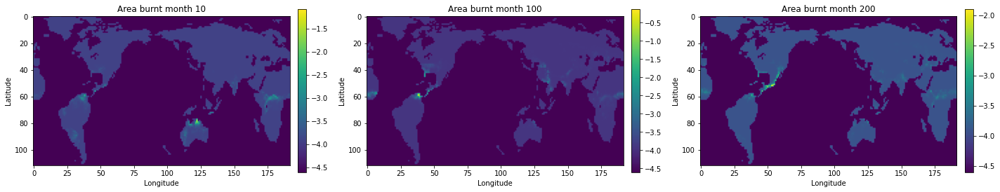

______________ Vegetation _____________


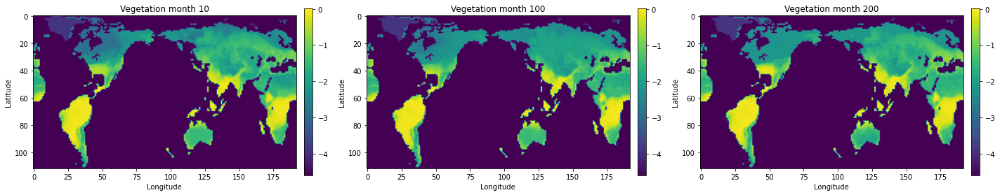

______________ Temperature _____________


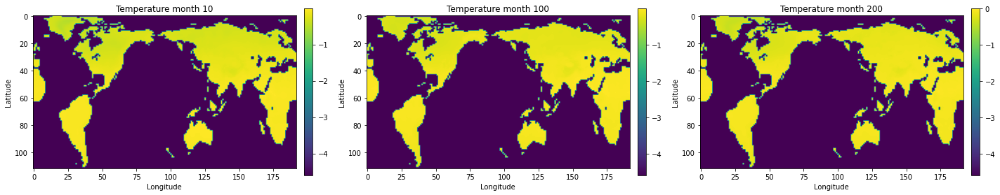

______________ Moisture _____________


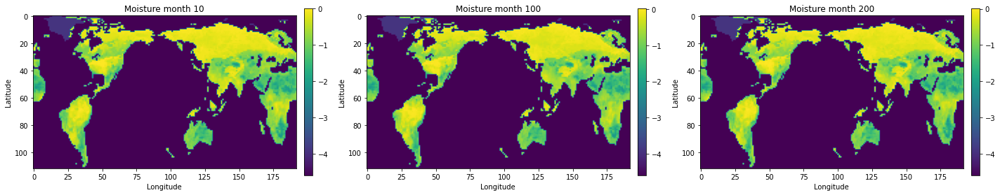

In [ ]:
print("______________ Area brunt _____________")
plot_data_img(nr = 1, nc=3, data=area_burnt_p4, true_data=area_burnt_p4, ts = [10, 100, 200], title='Area burnt month', threshold = 0.02)

print("______________ Vegetation _____________")
plot_data_img(nr = 1, nc=3, data=veg_data_p4, true_data=veg_data_p4, ts = [10, 100, 200], title='Vegetation month', threshold = 0.02)

print("______________ Temperature _____________")
plot_data_img(nr = 1, nc=3, data=T_data_p4, true_data=T_data_p4, ts = [10, 100, 200], title='Temperature month', threshold = 0.02)

print("______________ Moisture _____________")
plot_data_img(nr = 1, nc=3, data=moist_data_p4, true_data=moist_data_p4, ts = [10, 100, 200], title='Moisture month', threshold = 0.02)

### Import the compressors

In [9]:
# Load compressor
area_compressor = load_model('/content/drive/MyDrive/Wildfires_IRP/compressors/CAE_areaburnt')
moist_compressor = load_model('/content/drive/MyDrive/Wildfires_IRP/compressors/CAE_moist')
T_compressor = load_model('/content/drive/MyDrive/Wildfires_IRP/compressors/CAE_temp')
veg_compressor = load_model('/content/drive/MyDrive/Wildfires_IRP/compressors/CAE_veg')

In [10]:
area_encoder = area_compressor.get_layer(index=0)
moist_encoder = moist_compressor.get_layer(index=0)
temp_encoder = T_compressor.get_layer(index=0)
veg_encoder = veg_compressor.get_layer(index=0)

area_decoder = area_compressor.get_layer(index=1)
moist_decoder = moist_compressor.get_layer(index=1)
temp_decoder = T_compressor.get_layer(index=1)
veg_decoder = veg_compressor.get_layer(index=1)

### Load the models

In [11]:
# # uploading the models
CAE_LSTM_12to1 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/CAE_LSTM/CAE_LSTM_12to1.h5')
multi_CAE_LSTM_12to1 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CAE_LSTM/multi_CAE_LSTM_12to1.h5')
multi_CAE_LSTM_12to12 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CAE_LSTM/multi_CAE_LSTM_12to12.h5')
multi_CAE_LSTM_6to6 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CAE_LSTM/multi_CAE_LSTM_6to6.h5')
multi_CAE_LSTM_3to3 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CAE_LSTM/multi_CAE_LSTM_3to3.h5')

CNN_LSTM_12to1 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/CNN_LSTM/CNN_LSTM_12to1.h5')
multi_CNN_LSTM_12to1 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CNN_LSTM/multi_CNN_LSTM_12to1.h5')
multi_CNN_LSTM_12to12 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CNN_LSTM/multi_CNN_LSTM_12to12.h5')
multi_CNN_LSTM_6to6 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CNN_LSTM/multi_CNN_LSTM_6to6.h5')
multi_CNN_LSTM_3to3 = load_model('/content/drive/MyDrive/Wildfires_IRP/model/Multi_CNN_LSTM/multi_CNN_LSTM_3to3.h5')

### Predictions CAE LSTM - 12 to 1

In [13]:
# Split data - keep the 12 first - rest for testing
area_training_set_p4 = area_burnt_p4[0:12]
area_testing_set_p4 = area_burnt_p4[12:]
temp_training_set_p4 = T_data_p4[0:12]
temp_testing_set_p4 = T_data_p4[12:]
moist_training_set_p4 = moist_data_p4[0:12]
moist_testing_set_p4 = moist_data_p4[12:]
veg_training_set_p4 = veg_data_p4[0:12]
veg_testing_set_p4 = veg_data_p4[12:]

In [14]:
# Compress the data
area_training_comp_p4 = area_encoder.predict(area_training_set_p4)
print("Shape of P4 area training set after compression by the CAE: ", area_training_comp_p4.shape)

Shape of P4 area training set after compression by the CAE:  (12, 15)


In [15]:
start = time.time()
previous_month = 12

pred_CAE_M21_p4 = list(area_training_comp_p4[-previous_month:])

for i in range(0,348):
  pred_CAE_M21_p4.append(CAE_LSTM_12to1.predict(np.reshape(pred_CAE_M21_p4[-previous_month:], newshape=(1,previous_month,15)))[0]) # Must pay attention to inputs shape and ouptuts shape to make it works

fpred_M21_p4 = area_decoder.predict(np.asarray(pred_CAE_M21_p4))
fpredM21_p4 = np.squeeze(fpred_M21_p4)[previous_month:348+previous_month]

end = time.time()

In [16]:
print('Number of land point in the land mask : ', np.unique(land_mask, return_counts=True)[1][1])

#Applying the land mask to the predictions
for i in range(len(fpredM21_p4)):
  fpredM21_p4[i][land_mask==-1] = -0.01

Number of land point in the land mask :  6468


In [17]:
#Computing Relative error. The norm of difference between true and predictions divided by the number of land points
RE_CAE_LSTM_M21 = np.linalg.norm(area_burnt_p4_m[12:] - fpredM21_p4) / 6468

#Sumualtive sum of the Relative error
sumRE_CAE_M21 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(fpredM21_p4, area_burnt_p4_m[12:])])

#SSIM scores of the predictions - SSIM is included in sklearn package
ssim_CAE_M21 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(fpredM21_p4, area_burnt_p4_m[12:])]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  


In [18]:
results_CAE_LSTM_M21 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_CAE_LSTM_M21,
           'mean SSIM' : round(np.mean(ssim_CAE_M21)*100, 4)
          }

____________ Real images ________________


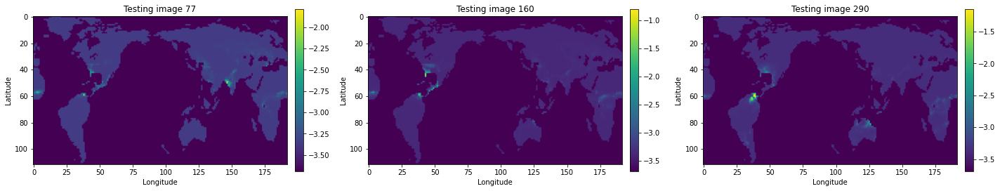

____________ Predictions 3 to 1 _____________ 


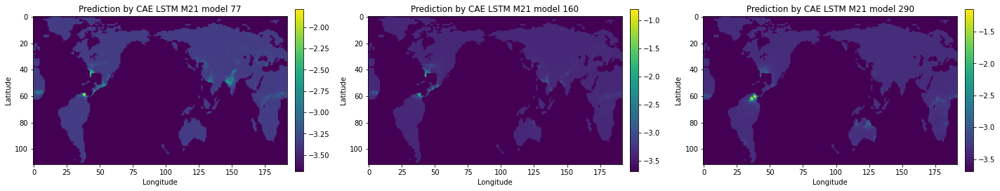

____________ Difference between both _____________ 


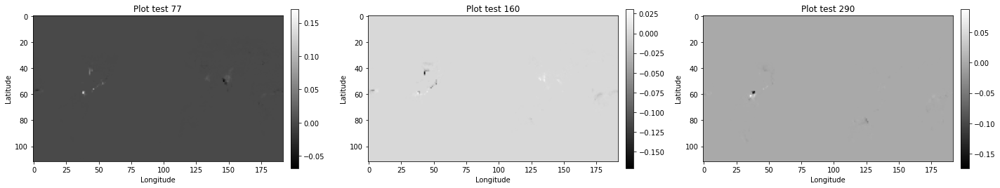

In [20]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[77, 160, 290], title='Testing image', threshold=0.035)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpredM21_p4, true_data=area_burnt_p4_m[12:], ts = [77, 160, 290], title='Prediction by CAE LSTM M21 model', threshold=0.035)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = fpredM21_p4, ts = [77, 160, 290])

### Predictions CNN lSTM 12 to 1

In [21]:
start = time.time()
previous_month = 12

pred_CNN_M21_p4 = list(np.reshape(area_burnt_p4[-previous_month:], newshape=(previous_month, 112, 192, 1)))

for i in range(0,348):
  pred_CNN_M21_p4.append(np.reshape(CNN_LSTM_12to1.predict(np.reshape(pred_CNN_M21_p4[-12:], newshape=(1, 12, 112, 192, 1))), newshape=(112, 192, 1))) #Attention to inputs shape and outputs hsape to make it works

fpred_cnn_M21_p4 = np.squeeze(pred_CNN_M21_p4)[previous_month:348+previous_month]

end = time.time()

In [22]:
#Applying the land mask
for i in range(len(fpred_cnn_M21_p4)) :
  fpred_cnn_M21_p4[i][land_mask==-1] = -0.01

In [23]:
#Computing RE/SSIM scores and cumualtive RE
RE_CNN_LSTM_M21 = np.linalg.norm(area_burnt_p4_m[12:] - fpred_cnn_M21_p4) / 6468

sumRE_CNN_M21 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(fpred_cnn_M21_p4, area_burnt_p4_m[12:])])
ssim_CNN_M21 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(fpred_cnn_M21_p4, area_burnt_p4_m[12:])]

In [24]:
results_CNN_LSTM_M21 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_CNN_LSTM_M21,
           'mean SSIM' : round(np.mean(ssim_CNN_M21)*100, 4)
          }

____________ Real images ________________


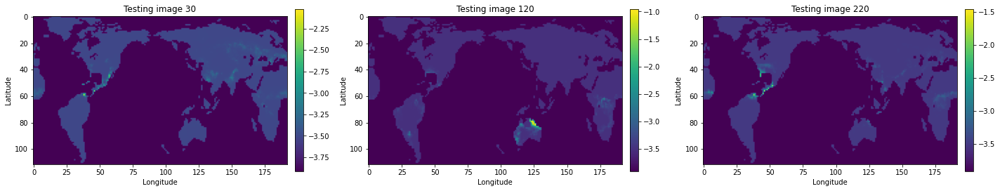

____________ Predictions 3 to 1 _____________ 


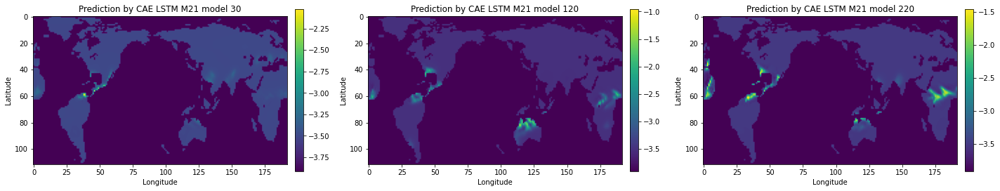

____________ Difference between both _____________ 


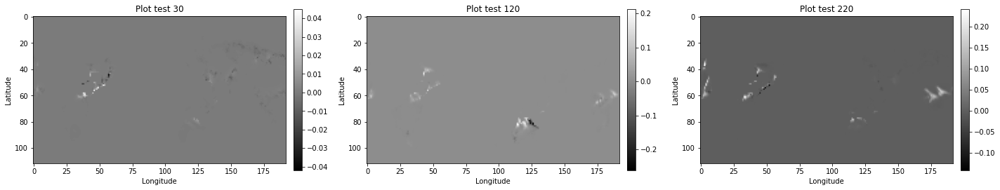

In [26]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = area_burnt_p4_m, true_data=area_burnt_p4_m, ts=[30, 120, 220], title='Testing image', threshold=0.03)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpred_cnn_M21_p4, true_data=area_burnt_p4_m, ts = [30, 120, 220], title='Prediction by CAE LSTM M21 model', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m, data2 = fpred_cnn_M21_p4, ts = [30, 120, 220])

### Predictions multi CAE LSTM - 12 to 1

In [27]:
#Now for Joint models, all environmental variables are taken as inputs
#Thus all of them needs to be compress with specific compressor
area_training_comp_p4 = area_encoder.predict(area_training_set_p4)
print("Shape of P1 area training set after compression by the CAE: ", area_training_comp_p4.shape)
moist_training_comp_p4 = moist_encoder.predict(moist_training_set_p4)
print("Shape of P1 moisture soil training set after compression by the CAE: ", moist_training_comp_p4.shape)
temp_training_comp_p4 = temp_encoder.predict(temp_training_set_p4)
print("Shape of P1 Temperature training set after compression by the CAE: ", temp_training_comp_p4.shape)
veg_training_comp_p4 = veg_encoder.predict(veg_training_set_p4)
print("Shape of P1 vegetation training set after compression by the CAE: ", veg_training_comp_p4.shape)

Shape of P1 area training set after compression by the CAE:  (12, 15)
Shape of P1 moisture soil training set after compression by the CAE:  (12, 15)
Shape of P1 Temperature training set after compression by the CAE:  (12, 15)
Shape of P1 vegetation training set after compression by the CAE:  (12, 15)


In [29]:
#Then concatenate them into one multi channel array
multivar_data_p4 = np.concatenate((area_training_comp_p4, moist_training_comp_p4, temp_training_comp_p4, veg_training_comp_p4), axis=1)

In [30]:
multivar_data_p4.shape

(12, 60)

In [31]:
start = time.time()
previous_month = 12

pred_multi_CAE_LSTM_M21_p4 = list(multivar_data_p4[-previous_month:])

for i in range(0,348):
  predictions_p4 = multi_CAE_LSTM_12to1.predict(np.reshape(pred_multi_CAE_LSTM_M21_p4[-previous_month:], newshape=(1,previous_month,60)))
  pred_multi_CAE_LSTM_M21_p4.append(np.reshape(predictions_p4, newshape=(60,)))

fpred_multivar_p4 = np.asarray(pred_multi_CAE_LSTM_M21_p4)[-348:]

#Deconding the predictions from latent space
area_burnt_pred_p4 = np.squeeze(area_decoder.predict(np.squeeze(fpred_multivar_p4[:, 0:15])))
moist_pred_p4 = np.squeeze(moist_decoder.predict(np.squeeze(fpred_multivar_p4[:, 15:30])))
temp_pred_p4 = np.squeeze(temp_decoder.predict(np.squeeze(fpred_multivar_p4[:, 30:45])))
veg_pred_p4 = np.squeeze(veg_decoder.predict(np.squeeze(fpred_multivar_p4[:, 45:60])))

end = time.time()

In [33]:
#Applying the land mask
for i in range(348) :
  area_burnt_pred_p4[i][land_mask==-1] = -0.01
  temp_pred_p4[i][land_mask==-1] = -0.01
  veg_pred_p4[i][land_mask==-1] = -0.01
  moist_pred_p4[i][land_mask==-1] = -0.01

In [34]:
#Computing the scores metrics
RE_multiCAE_LSTM_M21 = np.linalg.norm(area_burnt_p4_m[12:] - area_burnt_pred_p4) / 6468

sumRE_multiCAE_M21 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])])
ssim_multiCAE_M21 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])]

results_multi_CAE_LSTM_M21 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_multi_CAE_LSTM_M21_nw),
           'relative error':  RE_multiCAE_LSTM_M21,
           'mean SSIM' : round(np.mean(ssim_multiCAE_M21)*100, 4)
          }

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  """


#### Plots

____________ Real images of area burnt________________


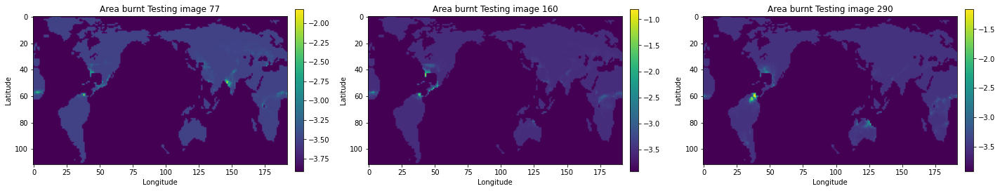

____________ Predictions multi CAE LSTM 6 to 1 _____________ 


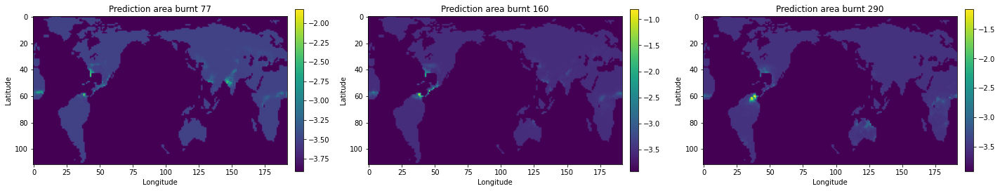

____________ Difference between both _____________ 


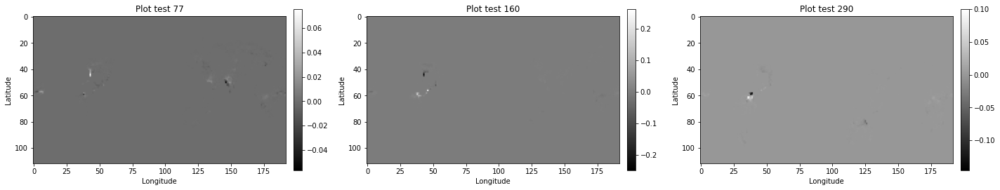

In [36]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[77, 160, 290], title='Area burnt Testing image', threshold=0.03)

print("____________ Predictions multi CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_p4, true_data= area_burnt_p4_m[12:], ts = [77, 160, 290], title='Prediction area burnt', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_p4, ts = [77, 160, 290])

____________ Real images of msoil moisture________________


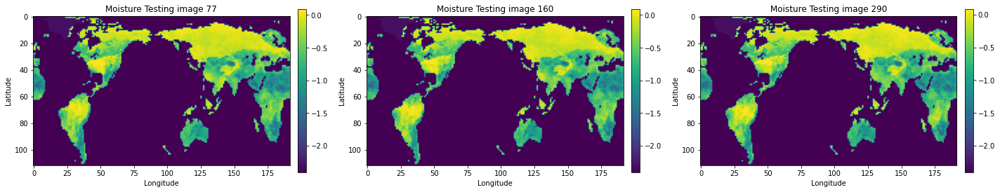

____________ Predictions mulit CAE LSTM 6 to 1 _____________ 


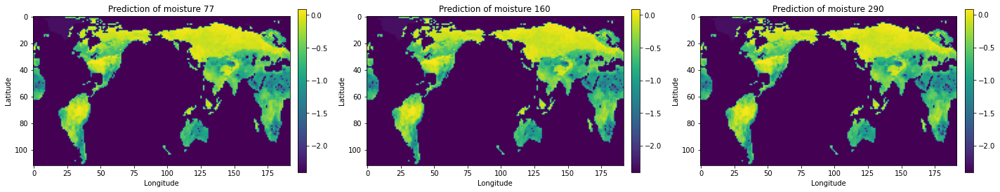

____________ Difference between both _____________ 


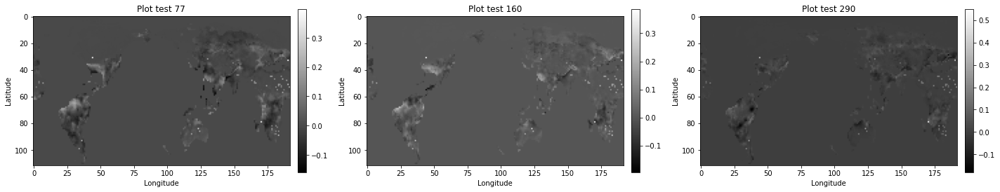

In [37]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_data_p4_m[12:], true_data=moist_data_p4_m[12:], ts=[77, 160, 290], title='Moisture Testing image', threshold=0.1)

print("____________ Predictions mulit CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 3, data = moist_pred_p4, true_data=moist_data_p4_m[12:], ts = [77, 160, 290], title='Prediction of moisture', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p4, data2 = moist_data_p4_m[12:], ts = [77, 160, 290])

____________ Real images of vegetation________________


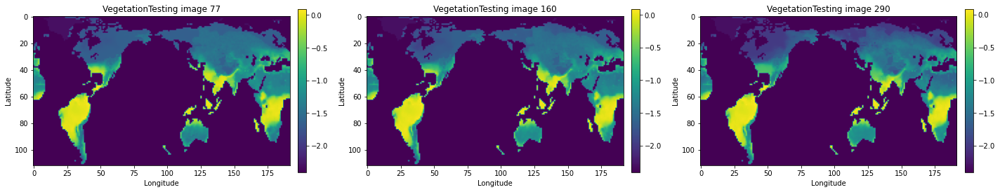

____________ Predictions multi CAE LSTM 6 to 1 _____________ 


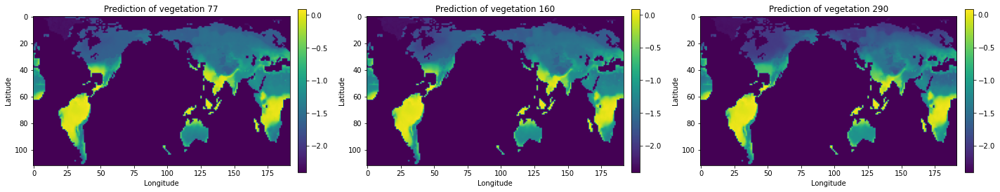

____________ Difference between both _____________ 


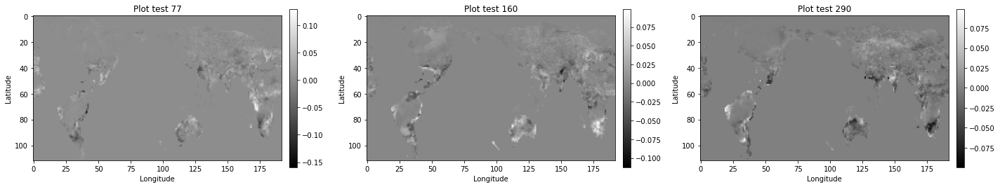

In [38]:
#Vegetation burnt 
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_data_p4_m[12:], true_data=veg_data_p4_m[12:], ts=[77, 160, 290], title='VegetationTesting image', threshold=0.1)

print("____________ Predictions multi CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 3, data = veg_pred_p4, true_data=veg_data_p4_m[12:], ts = [77, 160, 290], title='Prediction of vegetation', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p4, data2 = veg_data_p4_m[12:], ts = [77, 160, 290])

____________ Real images of temperature________________


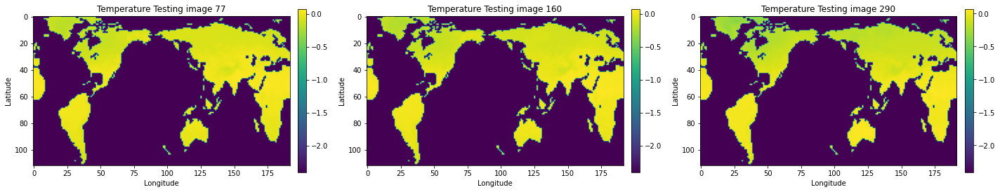

____________ Predictions multi CAE LSTM 6 to 1 _____________ 


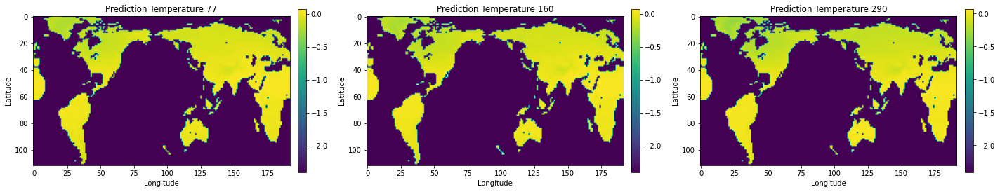

____________ Difference between both _____________ 


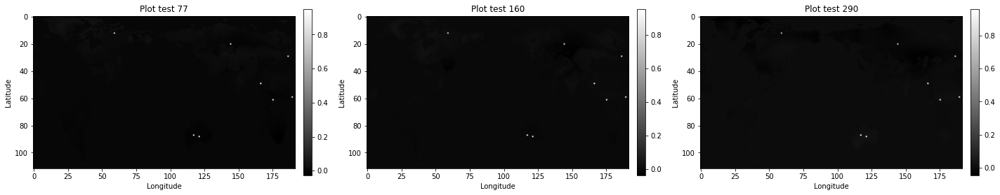

In [39]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = T_data_p4_m[12:], true_data=T_data_p4_m[12:], ts=[77, 160, 290], title='Temperature Testing image', threshold=0.1)

print("____________ Predictions multi CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 3, data = temp_pred_p4, true_data=T_data_p4_m[12:], ts = [77, 160, 290], title='Prediction Temperature', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p4, data2 = T_data_p4_m[12:], ts = [77, 160, 290])

### Predictions multi CNN lSTM 12 to 1

In [41]:
#No need for compression here - thus concatenation of the raw data
cnn_multivar_data_p4 = np.array([area_burnt_p4, moist_data_p4, T_data_p4, veg_data_p4])
cnn_multivar_data_p4 = np.expand_dims(cnn_multivar_data_p4, axis=-1)
cnn_multivar_data_p4 = np.swapaxes(cnn_multivar_data_p4, axis1=0, axis2=4)
cnn_multivar_data_p4 = np.squeeze(cnn_multivar_data_p4)
cnn_multivar_data_p4.shape

(360, 112, 192, 4)

In [42]:
start = time.time()
previous_month = 12

pred_multi_CNN_M21_p4 = list(cnn_multivar_data_p4[-previous_month:])

for i in range(0,348):
  last_months = np.reshape(pred_multi_CNN_M21_p4[-12:], newshape=(1, 12, 112, 192, 4))
  prediction = multi_CNN_LSTM_12to1.predict([last_months[:, :, :, :, :1], last_months[:, :, :, :, 1:2], last_months[:, :, :, :, 2:3], last_months[:, :, :, :, 3:]]) # Pay attention to inputs and outputs shapes to make it works
  pred_multi_CNN_M21_p4.append(np.squeeze(prediction))

fpred_multi_cnn_M21_p4 = pred_multi_CNN_M21_p4[previous_month:348+previous_month]

end = time.time()

In [43]:
fpred_multi_cnn_M21_p4 = np.asarray(fpred_multi_cnn_M21_p4)

fpred_areagb_multi_cnn_M21 = fpred_multi_cnn_M21_p4[: , :, :, 0]
fpred_soilm_multi_cnn_M21 = fpred_multi_cnn_M21_p4[: , :, :, 1]
fpred_veg_multi_cnn_M21 = fpred_multi_cnn_M21_p4[: , :, :, 3]
fpred_temp_multi_cnn_M21 = fpred_multi_cnn_M21_p4[: , :, :, 2]

#Applying the land mask to predictions
for i in range(348) :
  fpred_areagb_multi_cnn_M21[i][land_mask==-1] = -0.01
  fpred_soilm_multi_cnn_M21[i][land_mask==-1] = -0.01
  fpred_veg_multi_cnn_M21[i][land_mask==-1] = -0.01
  fpred_temp_multi_cnn_M21[i][land_mask==-1] = -0.01

In [44]:
#Computing the scores metrics
RE_multiCNN_LSTM_M21 = np.linalg.norm(area_burnt_p4_m[12:] - fpred_areagb_multi_cnn_M21) / 6468

sumRE_multiCNN_M21 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(fpred_areagb_multi_cnn_M21, area_burnt_p4_m[12:])])
ssim_multiCNN_M21 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(fpred_areagb_multi_cnn_M21, area_burnt_p4_m[12:])]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  """


In [45]:
results_multi_CNN_LSTM_M21 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_multiCNN_LSTM_M21,
           'mean SSIM' : round(np.mean(ssim_multiCNN_M21)*100, 4)
          }

##### Plots

____________ Real images ________________


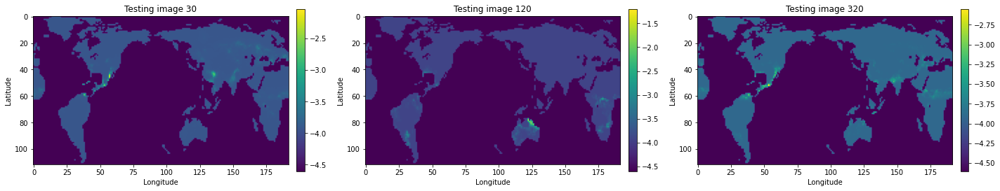

____________ Predictions 3 to 1 _____________ 


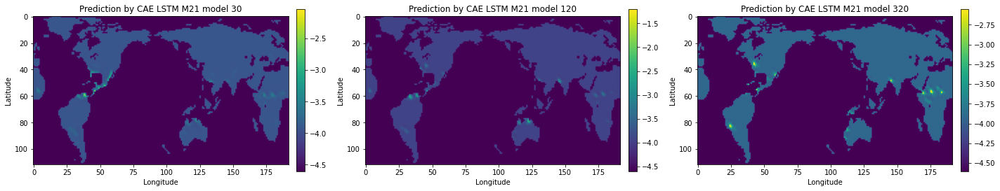

____________ Difference between both _____________ 


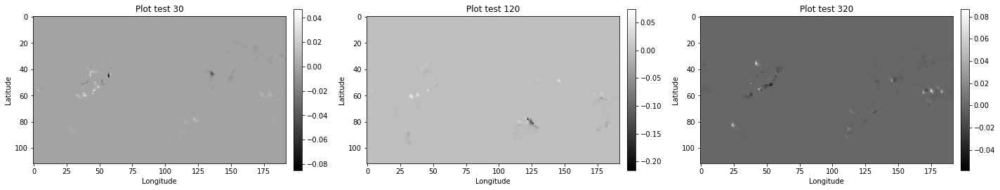

In [51]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[30, 120, 320], title='Testing image', threshold=0.02)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpred_areagb_multi_cnn_M21, true_data=area_burnt_p4_m[12:], ts = [30, 120, 320], title='Prediction by CAE LSTM M21 model', threshold=0.02)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = fpred_areagb_multi_cnn_M21, ts = [30, 120, 320])

____________ Real images ________________


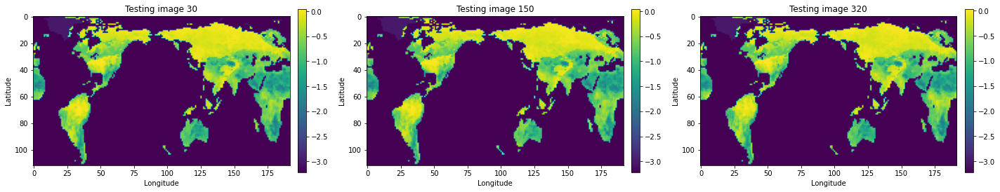

____________ Predictions 3 to 1 _____________ 


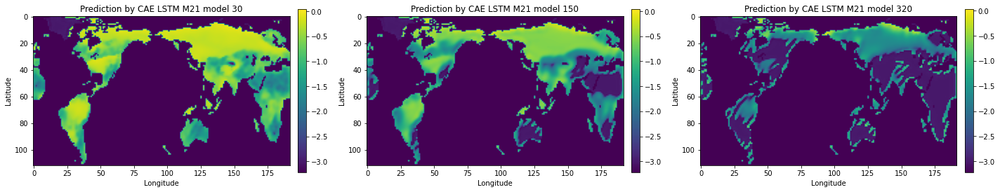

____________ Difference between both _____________ 


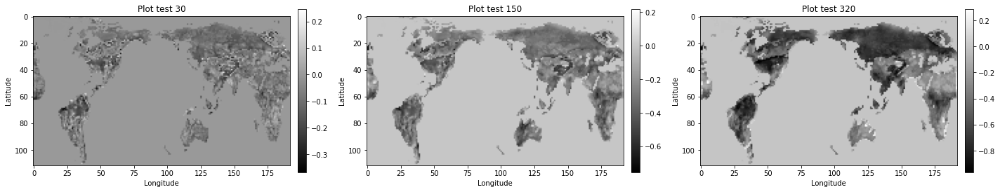

In [52]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = moist_data_p4_m[12:], true_data=moist_data_p4_m[12:], ts=[30, 150, 320], title='Testing image', threshold = 0.05)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpred_soilm_multi_cnn_M21, true_data=moist_data_p4_m[12:], ts = [30, 150, 320], title='Prediction by CAE LSTM M21 model', threshold = 0.05)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_data_p4_m[12:], data2 = fpred_soilm_multi_cnn_M21, ts = [30, 150, 320])

____________ Real images ________________


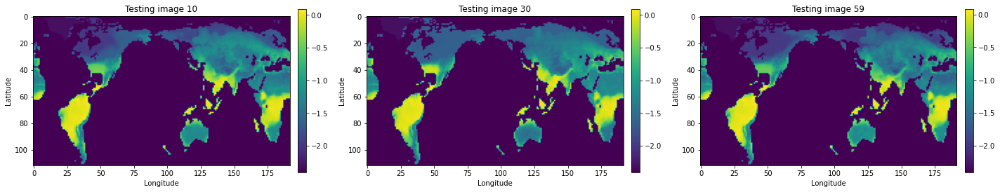

____________ Predictions 3 to 1 _____________ 


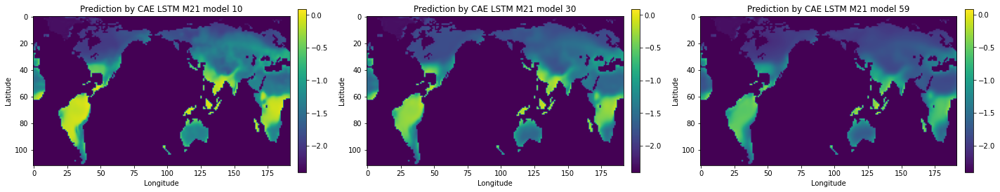

____________ Difference between both _____________ 


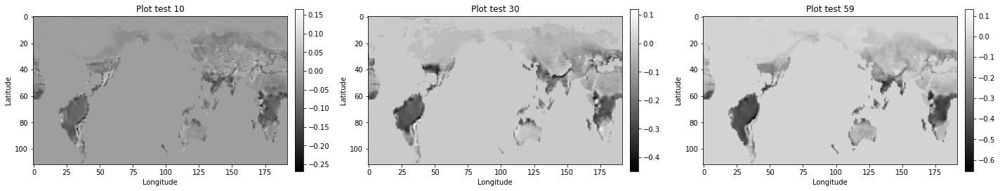

In [53]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = veg_data_p4_m[12:], true_data=veg_data_p4_m[12:], ts=[10, 30, 59], title='Testing image', threshold = 0.1)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpred_veg_multi_cnn_M21, true_data=veg_data_p4_m[12:], ts = [10, 30, 59], title='Prediction by CAE LSTM M21 model', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_data_p4_m[12:], data2 = fpred_veg_multi_cnn_M21, ts = [10, 30, 59])

____________ Real images ________________


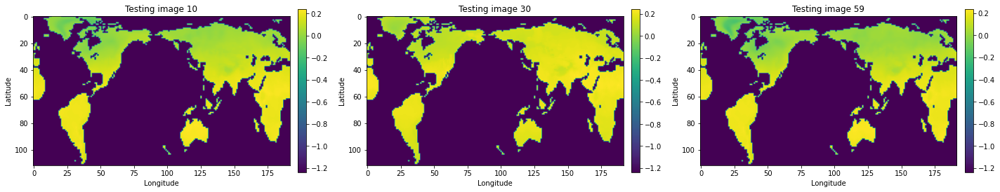

____________ Predictions 3 to 1 _____________ 


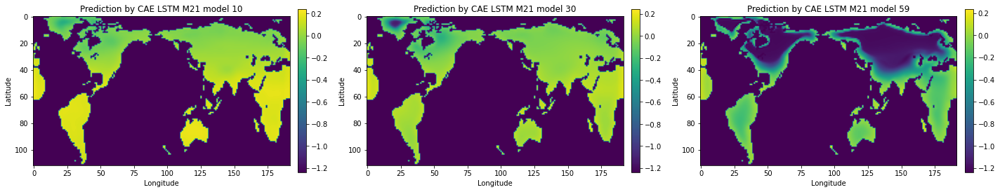

____________ Difference between both _____________ 


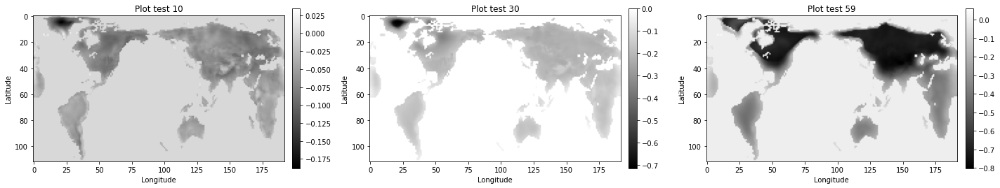

In [54]:
#Plot 3 to 1 
print("____________ Real images ________________")
plot_data_img(1, 3, data = T_data_p4_m[12:], true_data=T_data_p4_m[12:], ts=[10, 30, 59], title='Testing image', threshold=0.3)

print("____________ Predictions 3 to 1 _____________ ")
plot_data_img(1, 3, data = fpred_temp_multi_cnn_M21, true_data=T_data_p4_m[12:], ts = [10, 30, 59], title='Prediction by CAE LSTM M21 model', threshold=0.3)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = T_data_p4_m[12:], data2 = fpred_temp_multi_cnn_M21, ts = [10, 30, 59])

### Predictions multi CAE LSTM - 12 to 12

In [57]:
start = time.time()
previous_month = 12

pred_multi_CAE_LSTM_M2M_p4 = list(multivar_data_p4[-previous_month:])

while len(pred_multi_CAE_LSTM_M2M_p4) < previous_month+348:
  pred1 = multi_CAE_LSTM_12to12.predict(np.reshape(pred_multi_CAE_LSTM_M2M_p4[-previous_month:], newshape=(1,previous_month,60))) # Pay attention to dimensions to make it works
  preds1 = np.reshape(pred1, newshape=(previous_month,60))
  #models predicts 12 by 12 but each forecasts is added one by one
  for i in range(previous_month):
    pred_multi_CAE_LSTM_M2M_p4.append(preds1[i])

fpred_multivar_p4 = np.asarray(pred_multi_CAE_LSTM_M2M_p4)[-348:]

#Deconding the predictions and reshaping them
area_burnt_pred_p4 = np.squeeze(area_decoder.predict(np.squeeze(fpred_multivar_p4[:, 0:15])))
moist_pred_p4 = np.squeeze(moist_decoder.predict(np.squeeze(fpred_multivar_p4[:, 15:30])))
temp_pred_p4 = np.squeeze(temp_decoder.predict(np.squeeze(fpred_multivar_p4[:, 30:45])))
veg_pred_p4 = np.squeeze(veg_decoder.predict(np.squeeze(fpred_multivar_p4[:, 45:60])))

end = time.time()

In [59]:
# Applying the land mask to the predictions
for i in range(348) :
  area_burnt_pred_p4[i][land_mask==-1] = -0.01
  temp_pred_p4[i][land_mask==-1] = -0.01
  veg_pred_p4[i][land_mask==-1] = -0.01
  moist_pred_p4[i][land_mask==-1] = -0.01

In [60]:
#Computing the scores for he 3 metrics
RE_multiCAE_LSTM_M2M = np.linalg.norm(area_burnt_p4_m[12:] - area_burnt_pred_p4) / 6468

sumRE_multiCAE_M2M = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])])
ssim_multiCAE_M2M = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])]

results_multi_CAE_LSTM_12to12 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_multi_CAE_LSTM_6to6_nw),
           'relative error':  RE_multiCAE_LSTM_M2M,
           'mean SSIM' : round(np.mean(ssim_multiCAE_M2M)*100, 4)
          }

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  """


#### Plots

____________ Real images of area burnt________________


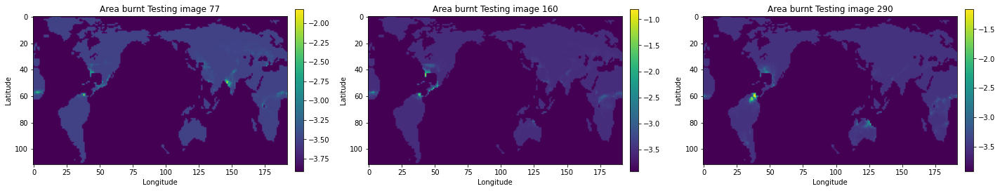

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


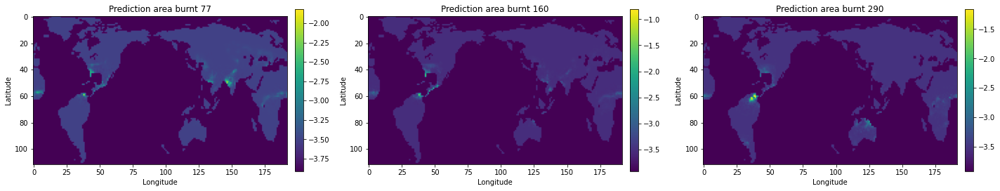

____________ Difference between both _____________ 


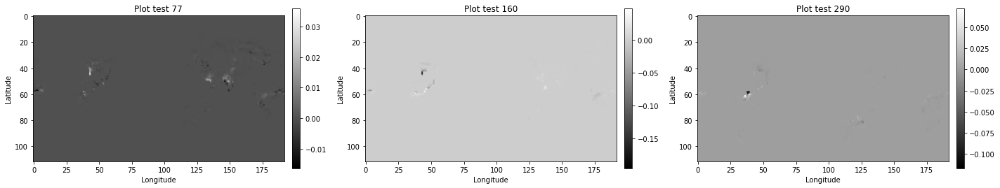

In [62]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[77, 160, 290], title='Area burnt Testing image', threshold=0.03)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_p4, true_data= area_burnt_p4_m[12:], ts = [77, 160, 290], title='Prediction area burnt', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_p4, ts = [77, 160, 290])

____________ Real images of msoil moisture________________


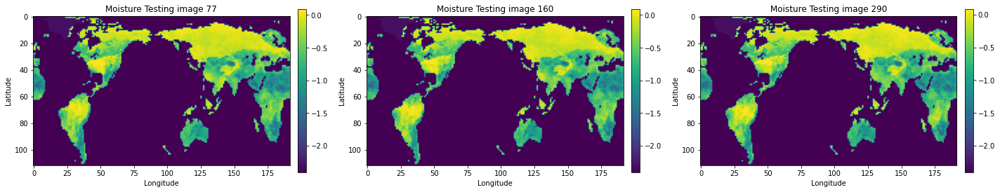

____________ Predictions mulit CAE LSTM 12 to 12 _____________ 


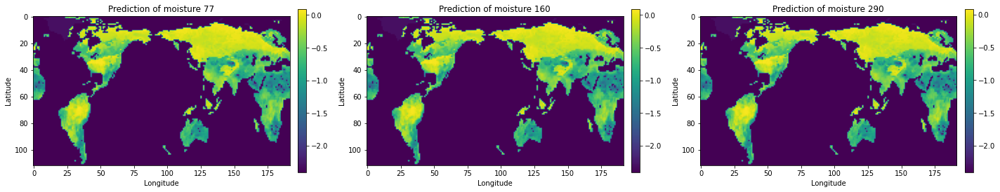

____________ Difference between both _____________ 


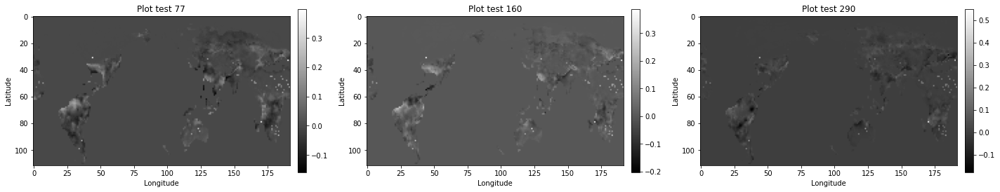

In [63]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_data_p4_m[12:], true_data=moist_data_p4_m[12:], ts=[77, 160, 290], title='Moisture Testing image', threshold=0.1)

print("____________ Predictions mulit CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = moist_pred_p4, true_data=moist_data_p4_m[12:], ts = [77, 160, 290], title='Prediction of moisture', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p4, data2 = moist_data_p4_m[12:], ts = [77, 160, 290])

____________ Real images of vegetation________________


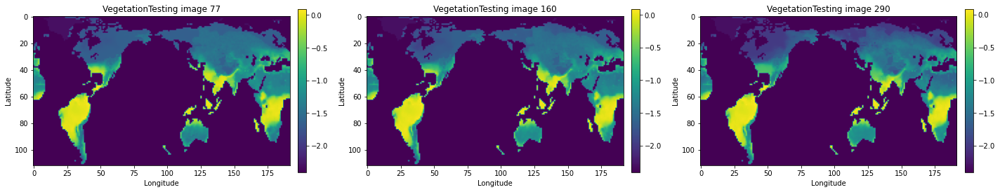

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


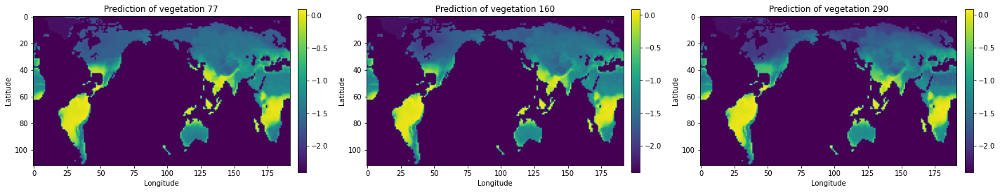

____________ Difference between both _____________ 


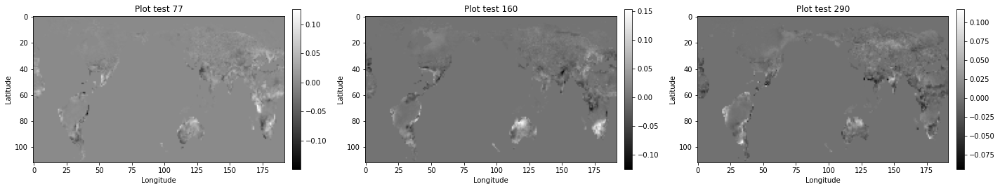

In [64]:
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_data_p4_m[12:], true_data=veg_data_p4_m[12:], ts=[77, 160, 290], title='VegetationTesting image', threshold = 0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = veg_pred_p4, true_data=veg_data_p4_m[12:], ts = [77, 160, 290], title='Prediction of vegetation', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p4, data2 = veg_data_p4_m[12:], ts = [77, 160, 290])

____________ Real images of temperature________________


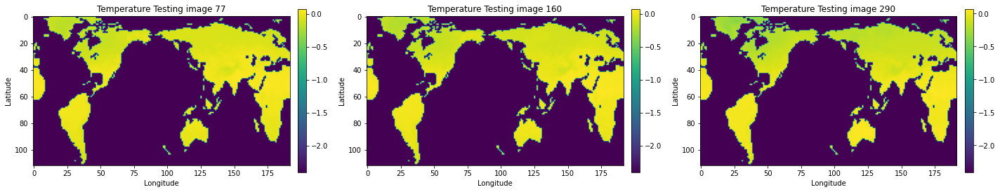

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


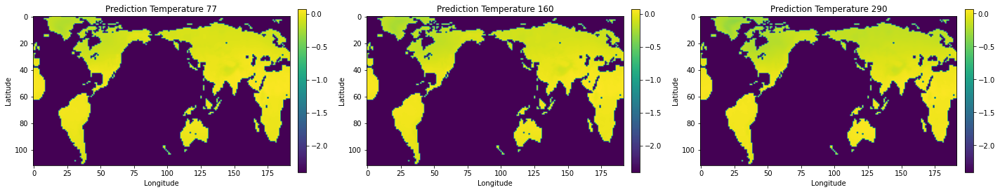

____________ Difference between both _____________ 


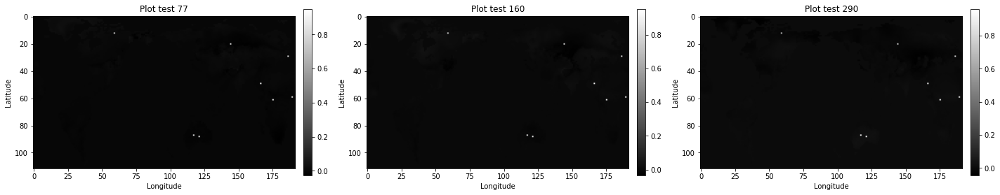

In [65]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = T_data_p4_m[12:], true_data=T_data_p4_m[12:], ts=[77, 160, 290], title='Temperature Testing image', threshold=0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = temp_pred_p4, true_data=T_data_p4_m[12:], ts = [77, 160, 290], title='Prediction Temperature', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p4, data2 = T_data_p4_m[12:], ts = [77, 160, 290])

### Predictions multi CNN lSTM 12 to 12

In [66]:
start = time.time()

previous_month = 12

pred_multi_CNN_M2M_p4 = list(cnn_multivar_data_p4[-previous_month:])

while len(pred_multi_CNN_M2M_p4) < 348 + previous_month :
  last_months = np.expand_dims(pred_multi_CNN_M2M_p4[-previous_month:], axis=0)
  prediction = np.squeeze(multi_CNN_LSTM_12to12.predict([last_months[:, :, :, :, :1], last_months[:, :, :, :, 1:2], last_months[:, :, :, :, 2:3], last_months[:, :, :, :, 3:]])) # Pay attention to dimensions to make it work
  for i in range(previous_month):
    pred_multi_CNN_M2M_p4.append(prediction[i])

fpred_multi_cnn_M2M_p4 = np.squeeze(pred_multi_CNN_M2M_p4)[previous_month:348+previous_month]
end = time.time()

In [67]:
area_burnt_pred_p4 = np.squeeze(fpred_multi_cnn_M2M_p4[:, :, :, 0])
moist_pred_p4 = np.squeeze(fpred_multi_cnn_M2M_p4[:, :, :, 1])
temp_pred_p4 = np.squeeze(fpred_multi_cnn_M2M_p4[:, :, :, 2])
veg_pred_p4 = np.squeeze(fpred_multi_cnn_M2M_p4[:, :, :, 3])

#Applying the land mask to predictions
for i in range(348) :
  area_burnt_pred_p4[i][land_mask==-1] = -0.01
  moist_pred_p4[i][land_mask==-1] = -0.01
  veg_pred_p4[i][land_mask==-1] = -0.01
  temp_pred_p4[i][land_mask==-1] = -0.01

In [68]:
#Computing the metrics results 
RE_multiCNN_LSTM_M2M = np.linalg.norm(area_burnt_p4_m[12:] - area_burnt_pred_p4) / 6468

sumRE_multiCNN_M2M = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])])
ssim_multiCNN_M2M = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[12:])]

In [69]:
results_multi_CNN_LSTM_M2M = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_multiCNN_LSTM_M2M,
           'mean SSIM' : round(np.mean(ssim_multiCNN_M2M)*100, 4)
          }

____________ Real images of area burnt________________


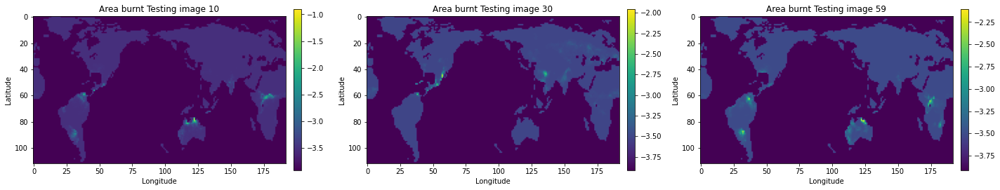

____________ Predictions multi CNN LSTM 12 to 12 _____________ 


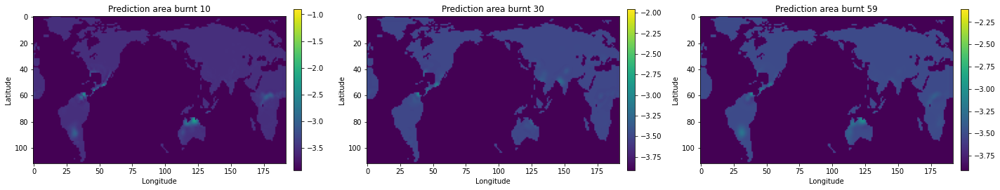

____________ Difference between both _____________ 


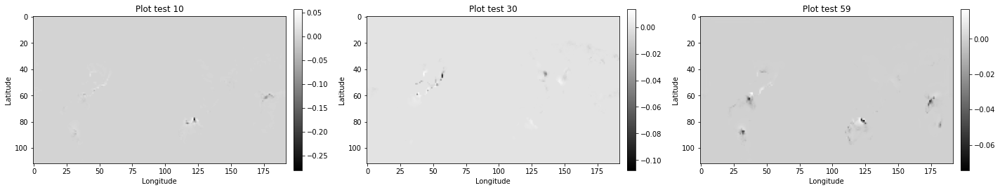

In [71]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[10, 30, 59], title='Area burnt Testing image', threshold=0.03)

print("____________ Predictions multi CNN LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_p4, true_data= area_burnt_p4_m[12:], ts = [10, 30, 59], title='Prediction area burnt', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_p4, ts = [10, 30, 59])

#### Plots

____________ Real images of msoil moisture________________


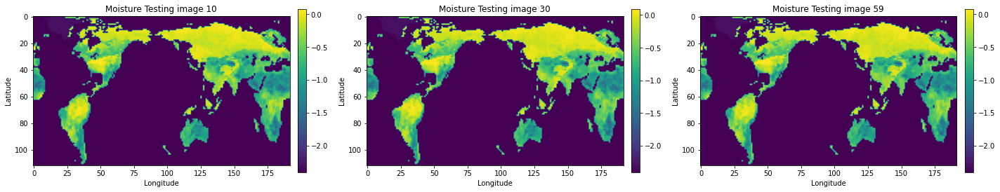

____________ Predictions mulit CAE LSTM 12 to 12 _____________ 


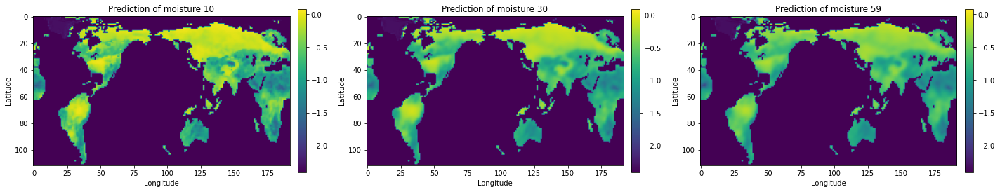

____________ Difference between both _____________ 


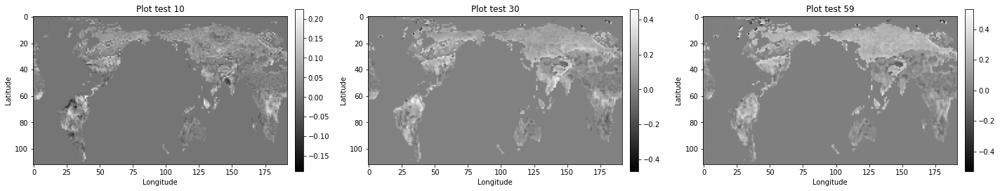

In [72]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_data_p4_m[12:], true_data=moist_data_p4_m[12:], ts=[10, 30, 59], title='Moisture Testing image', threshold = 0.1)

print("____________ Predictions mulit CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = moist_pred_p4, true_data=moist_data_p4_m[12:], ts = [10, 30, 59], title='Prediction of moisture', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p4, data2 = moist_data_p4_m[12:], ts = [10, 30, 59])

____________ Real images of vegetation________________


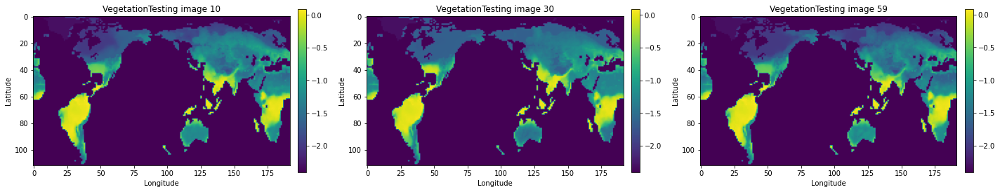

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


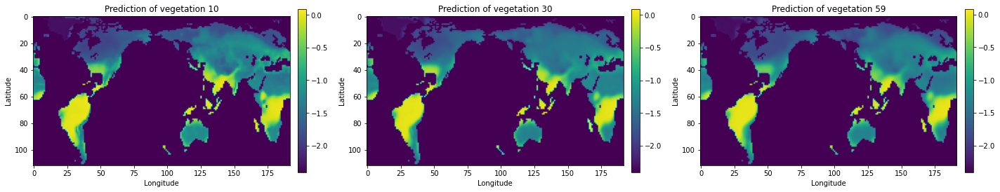

____________ Difference between both _____________ 


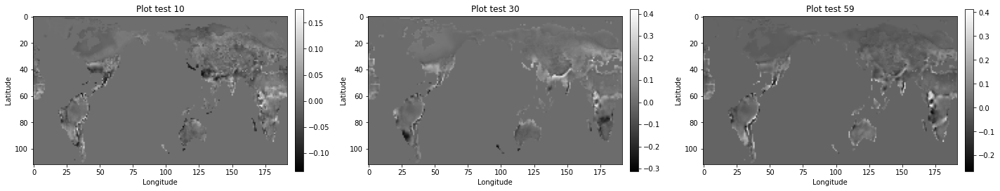

In [73]:
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_data_p4_m[12:], true_data=veg_data_p4_m[12:], ts=[10, 30, 59], title='VegetationTesting image', threshold = 0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = veg_pred_p4, true_data=veg_data_p4_m[12:], ts = [10, 30, 59], title='Prediction of vegetation', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p4, data2 = veg_data_p4_m[12:], ts = [10, 30, 59])

____________ Real images of temperature________________


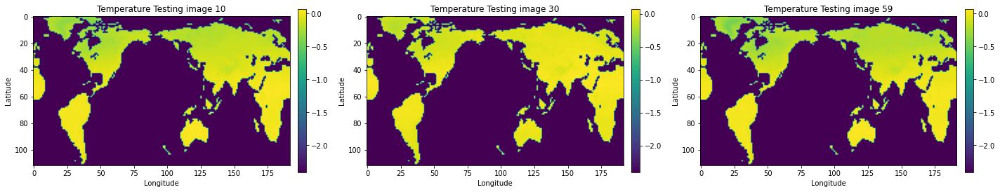

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


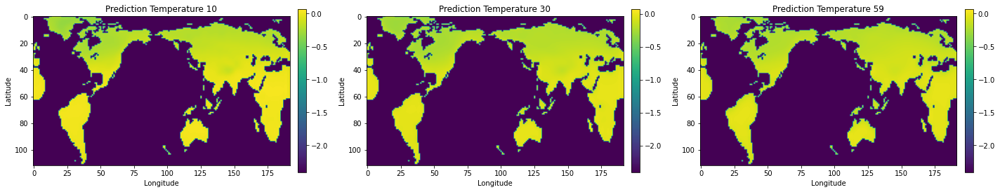

____________ Difference between both _____________ 


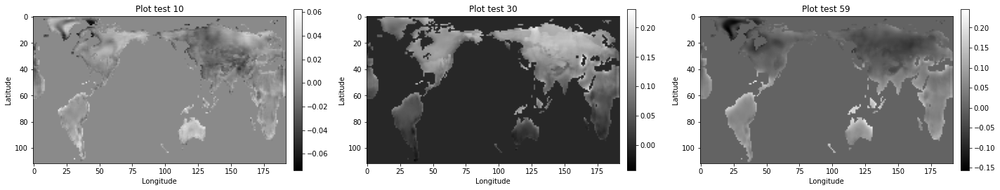

In [74]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = T_data_p4_m[12:], true_data=T_data_p4_m[12:], ts=[10, 30, 59], title='Temperature Testing image', threshold = 0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = temp_pred_p4, true_data=T_data_p4_m[12:], ts = [10, 30, 59], title='Prediction Temperature', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p4, data2 = T_data_p4_m[12:], ts = [10, 30, 59])

### Predictions multi CAE LSTM 6 to 6

In [75]:
start = time.time()
previous_month = 6

pred_multi_CAE_LSTM_M2M_p4 = list(multivar_data_p4[-previous_month:])

while len(pred_multi_CAE_LSTM_M2M_p4) < previous_month+354:
  pred1 = multi_CAE_LSTM_6to6.predict(np.reshape(pred_multi_CAE_LSTM_M2M_p4[-previous_month:], newshape=(1,previous_month,60)))
  preds1 = np.reshape(pred1, newshape=(previous_month,60))
  for i in range(previous_month):
    pred_multi_CAE_LSTM_M2M_p4.append(preds1[i])

fpred_multivar_p4 = np.asarray(pred_multi_CAE_LSTM_M2M_p4)[-354:]

area_burnt_pred_p4 = np.squeeze(area_decoder.predict(np.squeeze(fpred_multivar_p4[:, 0:15])))
moist_pred_p4 = np.squeeze(moist_decoder.predict(np.squeeze(fpred_multivar_p4[:, 15:30])))
temp_pred_p4 = np.squeeze(temp_decoder.predict(np.squeeze(fpred_multivar_p4[:, 30:45])))
veg_pred_p4 = np.squeeze(veg_decoder.predict(np.squeeze(fpred_multivar_p4[:, 45:60])))

end = time.time()

In [76]:
for i in range(354):
  area_burnt_pred_p4[i][land_mask==-1] = -0.01
  temp_pred_p4[i][land_mask==-1] = -0.01
  veg_pred_p4[i][land_mask==-1] = -0.01
  moist_pred_p4[i][land_mask==-1] = -0.01

In [77]:
RE_multiCAE_LSTM_6to6 = np.linalg.norm(area_burnt_p4_m[6:] - area_burnt_pred_p4) / 6468

sumRE_multiCAE_6to6 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[6:])])
ssim_multiCAE_6to6 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[6:])]

results_multi_CAE_LSTM_6to6 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_multi_CAE_LSTM_6to6_nw),
           'relative error':  RE_multiCAE_LSTM_6to6,
           'mean SSIM' : round(np.mean(ssim_multiCAE_6to6)*100, 4)
          }

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  after removing the cwd from sys.path.


____________ Real images of area burnt________________


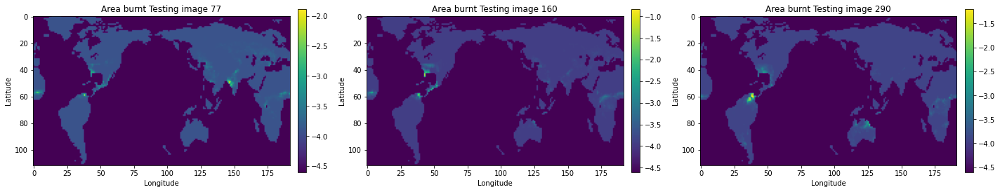

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


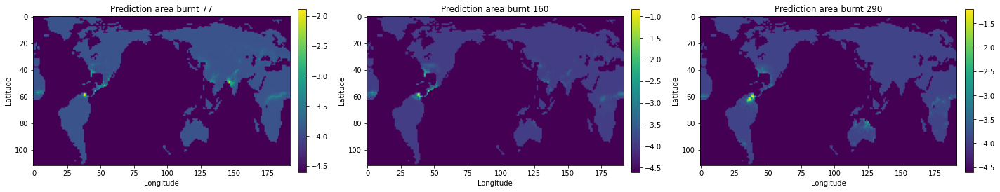

____________ Difference between both _____________ 


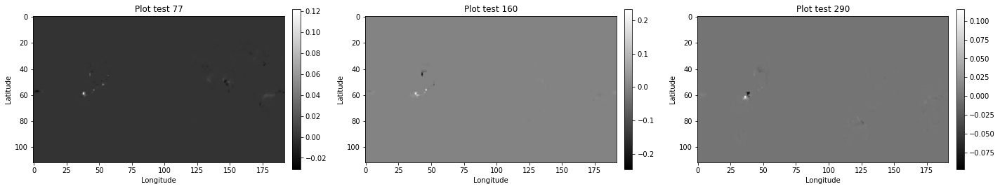

In [79]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[77, 160, 290], title='Area burnt Testing image', threshold = 0.02)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_p4, true_data= area_burnt_p4_m[12:], ts = [77, 160, 290], title='Prediction area burnt', threshold = 0.02)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_p4, ts = [77, 160, 290])

#### Plots

____________ Real images of msoil moisture________________


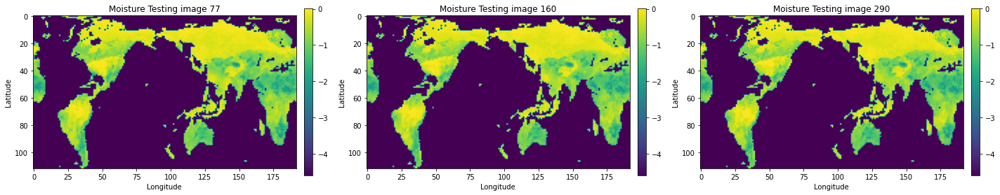

____________ Predictions mulit CAE LSTM 12 to 12 _____________ 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in log


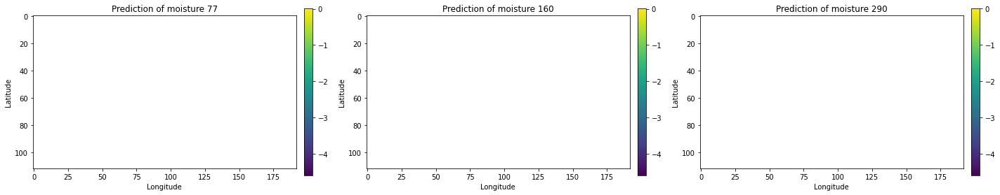

____________ Difference between both _____________ 


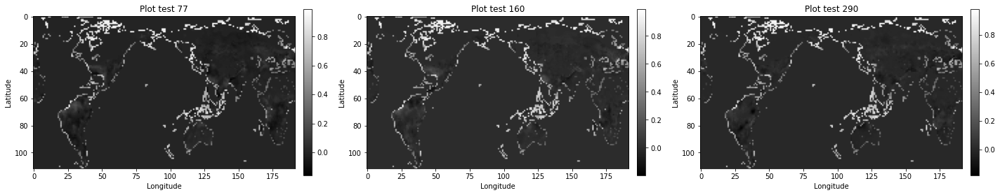

In [80]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_testing_set_p4, true_data=moist_testing_set_p4, ts=[77, 160, 290], title='Moisture Testing image')

print("____________ Predictions mulit CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = moist_pred_p4, true_data=moist_testing_set_p4, ts = [77, 160, 290], title='Prediction of moisture')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p4, data2 = moist_testing_set_p4, ts = [77, 160, 290])

____________ Real images of vegetation________________


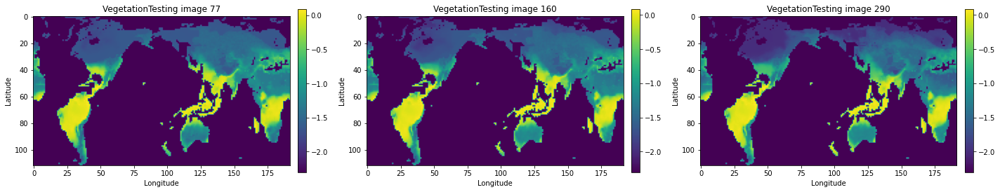

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


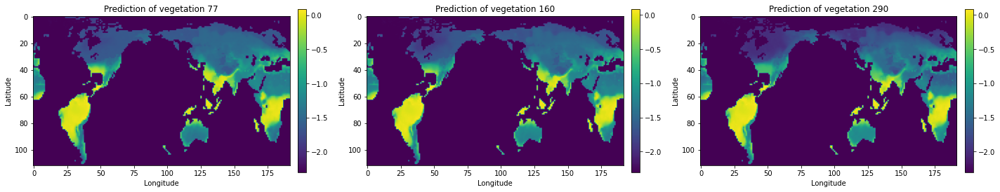

____________ Difference between both _____________ 


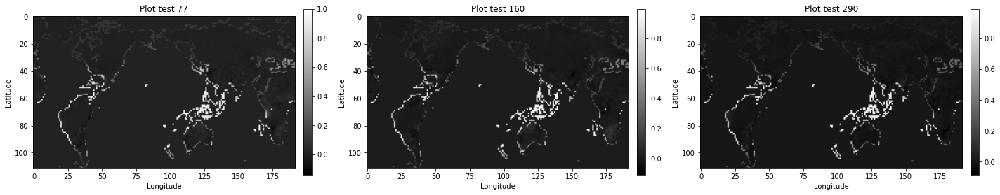

In [81]:
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_testing_set_p4, true_data=veg_testing_set_p4, ts=[77, 160, 290], title='VegetationTesting image', threshold = 0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = veg_pred_p4, true_data=veg_testing_set_p4, ts = [77, 160, 290], title='Prediction of vegetation', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p4, data2 = veg_testing_set_p4, ts = [77, 160, 290])

____________ Real images of temperature________________


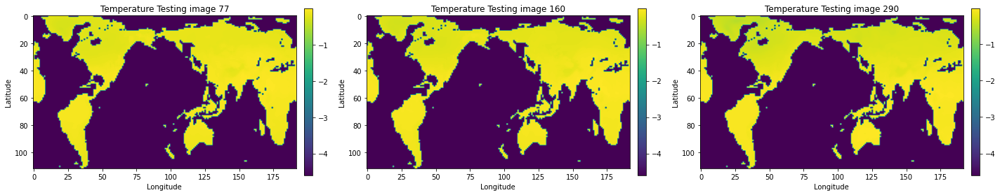

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in log


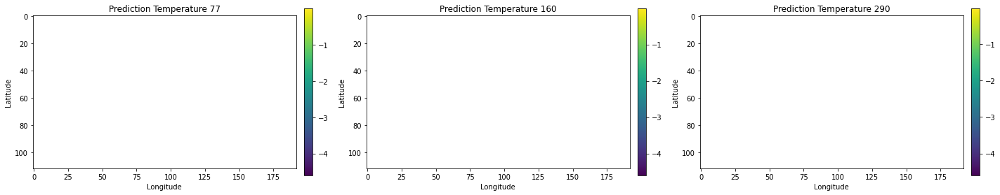

____________ Difference between both _____________ 


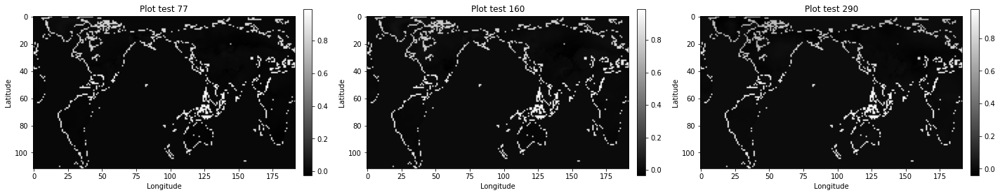

In [82]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = temp_testing_set_p4, true_data=temp_testing_set_p4, ts=[77, 160, 290], title='Temperature Testing image')

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = temp_pred_p4, true_data=temp_testing_set_p4, ts = [77, 160, 290], title='Prediction Temperature')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p4, data2 = temp_testing_set_p4, ts = [77, 160, 290])

### Predictions multi CNN lSTM 6 to 6

In [83]:
start = time.time()

previous_month = 6

pred_multi_CNN_M2M_p4 = list(cnn_multivar_data_p4[-previous_month:])

while len(pred_multi_CNN_M2M_p4) < 354 + previous_month :
  last_months = np.reshape(pred_multi_CNN_M2M_p4[-previous_month:], newshape=(1, previous_month, 112, 192, 4))
  prediction = np.squeeze(multi_CNN_LSTM_6to6.predict([last_months[:, :, :, :, :1], last_months[:, :, :, :, 1:2], last_months[:, :, :, :, 2:3], last_months[:, :, :, :, 3:]]))
  for i in range(previous_month):
    pred_multi_CNN_M2M_p4.append(prediction[i])

fpred_multi_cnn_M2M_6to6_p4 = np.squeeze(pred_multi_CNN_M2M_p4)[previous_month:354+previous_month]
end = time.time()

In [84]:
area_burnt_pred_6to6_p4 = np.squeeze(fpred_multi_cnn_M2M_6to6_p4[:, :, :, 0])
moist_pred_6to6_p4 = np.squeeze(fpred_multi_cnn_M2M_6to6_p4[:, :, :, 1])
temp_pred_6to6_p4 = np.squeeze(fpred_multi_cnn_M2M_6to6_p4[:, :, :, 2])
veg_pred_6to6_p4 = np.squeeze(fpred_multi_cnn_M2M_6to6_p4[:, :, :, 3])

for i in range(354) :
  area_burnt_pred_6to6_p4[i][land_mask==-1] = -0.01
  moist_pred_6to6_p4[i][land_mask==-1] = -0.01
  veg_pred_6to6_p4[i][land_mask==-1] = -0.01
  temp_pred_6to6_p4[i][land_mask==-1] = -0.01

In [85]:
RE_multiCNN_LSTM_6to6 = np.linalg.norm(area_burnt_p4_m[6:] - area_burnt_pred_6to6_p4) / 6468

sumRE_multiCNN_6to6 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_6to6_p4, area_burnt_p4_m[6:])])
ssim_multiCNN_6to6 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_6to6_p4, area_burnt_p4_m[6:])]

In [86]:
results_multi_CNN_LSTM_6to6 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_multiCNN_LSTM_6to6,
           'mean SSIM' : round(np.mean(ssim_multiCNN_6to6)*100, 4)
          }

____________ Real images of area burnt________________


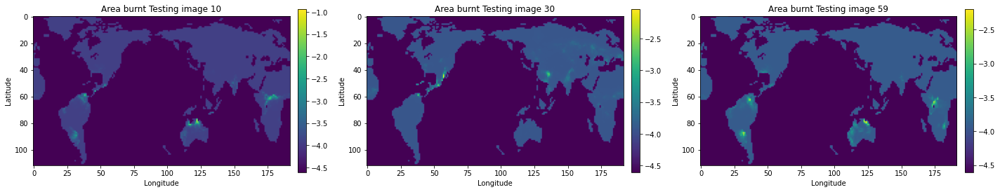

____________ Predictions multi CNN LSTM 12 to 12 _____________ 


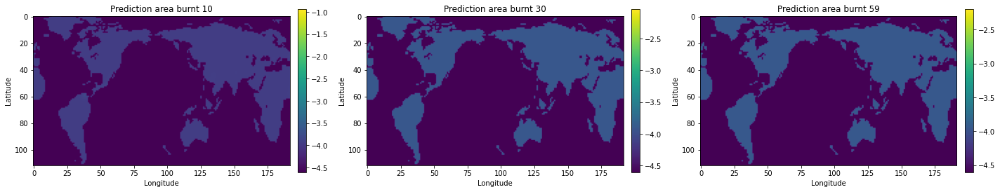

____________ Difference between both _____________ 


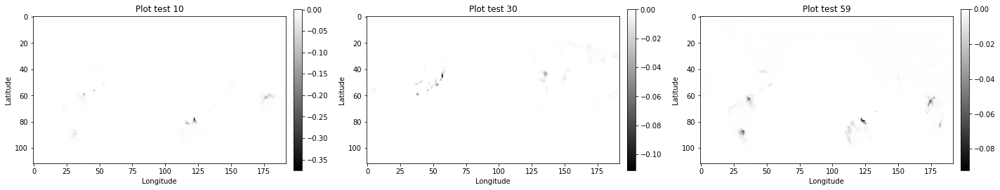

In [88]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[10, 30, 59], title='Area burnt Testing image', threshold=0.02)

print("____________ Predictions multi CNN LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_6to6_p4, true_data= area_burnt_p4_m[12:], ts = [10, 30, 59], title='Prediction area burnt', threshold=0.02)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_6to6_p4, ts = [10, 30, 59])

### Predictions multi CAE LSTM 3 to 3

In [90]:
start = time.time()
previous_month = 3

pred_multi_CAE_LSTM_M2M_p4 = list(multivar_data_p4[-previous_month:])

while len(pred_multi_CAE_LSTM_M2M_p4) < previous_month+357:
  pred1 = multi_CAE_LSTM_3to3.predict(np.reshape(pred_multi_CAE_LSTM_M2M_p4[-previous_month:], newshape=(1,previous_month,60)))
  preds1 = np.reshape(pred1, newshape=(previous_month,60))
  for i in range(previous_month):
    pred_multi_CAE_LSTM_M2M_p4.append(preds1[i])

fpred_multivar_p4 = np.asarray(pred_multi_CAE_LSTM_M2M_p4)[-357:]

area_burnt_pred_p4 = np.squeeze(area_decoder.predict(np.squeeze(fpred_multivar_p4[:, 0:15])))
moist_pred_p4 = np.squeeze(moist_decoder.predict(np.squeeze(fpred_multivar_p4[:, 15:30])))
temp_pred_p4 = np.squeeze(temp_decoder.predict(np.squeeze(fpred_multivar_p4[:, 30:45])))
veg_pred_p4 = np.squeeze(veg_decoder.predict(np.squeeze(fpred_multivar_p4[:, 45:60])))

end = time.time()

In [91]:
for i in range(357) :
  area_burnt_pred_p4[i][land_mask==-1] = -0.01
  moist_pred_p4[i][land_mask==-1] = -0.01
  veg_pred_p4[i][land_mask==-1] = -0.01
  temp_pred_p4[i][land_mask==-1] = -0.01

In [92]:
RE_multiCAE_LSTM_3to3 = np.linalg.norm(area_burnt_p4_m[3:] - area_burnt_pred_p4) / 6468

sumRE_multiCAE_3to3 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[3:])])
ssim_multiCAE_3to3 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_p4, area_burnt_p4_m[3:])]

results_multi_CAE_LSTM_3to3 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_multi_CAE_LSTM_6to6_nw),
           'relative error':  RE_multiCAE_LSTM_3to3,
           'mean SSIM' : round(np.mean(ssim_multiCAE_3to3)*100, 4)
          }

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  after removing the cwd from sys.path.


____________ Real images of area burnt________________


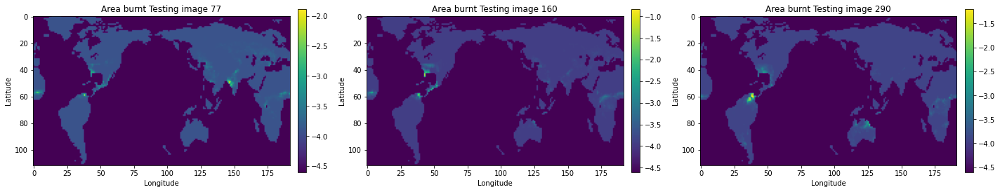

____________ Predictions multi CAE LSTM 12 to 12 _____________ 


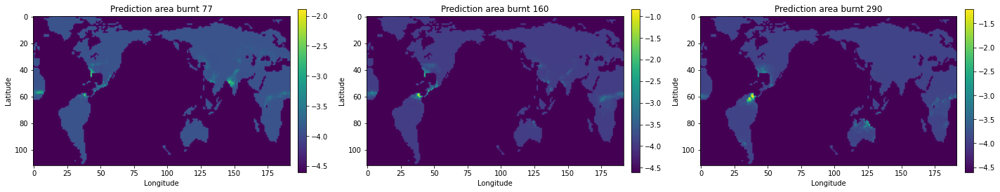

____________ Difference between both _____________ 


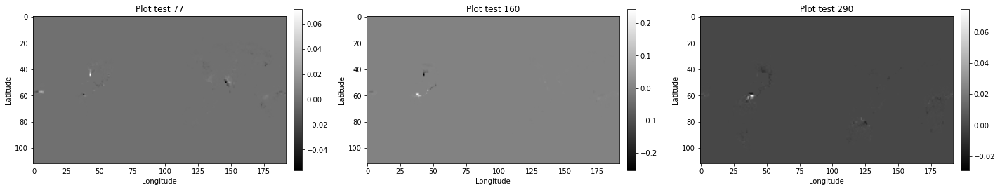

In [94]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[77, 160, 290], title='Area burnt Testing image', threshold=0.02)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_p4, true_data= area_burnt_p4_m[12:], ts = [77, 160, 290], title='Prediction area burnt', threshold=0.02)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = area_burnt_pred_p4, ts = [77, 160, 290])

#### Plots

In [ ]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_testing_set_p4, true_data=moist_testing_set_p4, ts=[77, 160, 290], title='Moisture Testing image')

print("____________ Predictions mulit CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = moist_pred_p4, true_data=moist_testing_set_p4, ts = [77, 160, 290], title='Prediction of moisture')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p4, data2 = moist_testing_set_p4, ts = [77, 160, 290])

In [ ]:
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_testing_set_p4, true_data=veg_testing_set_p4, ts=[77, 160, 290], title='VegetationTesting image', threshold = 0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = veg_pred_p4, true_data=veg_testing_set_p4, ts = [77, 160, 290], title='Prediction of vegetation', threshold = 0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p4, data2 = veg_testing_set_p4, ts = [77, 160, 290])

In [ ]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = temp_testing_set_p4, true_data=temp_testing_set_p4, ts=[77, 160, 290], title='Temperature Testing image')

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = temp_pred_p4, true_data=temp_testing_set_p4, ts = [77, 160, 290], title='Prediction Temperature')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p4, data2 = temp_testing_set_p4, ts = [77, 160, 290])

### Predictions multi CNN lSTM 3 to 3

In [95]:
start = time.time()

previous_month = 3

pred_multi_CNN_M2M_p4 = list(cnn_multivar_data_p4[-previous_month:])

while len(pred_multi_CNN_M2M_p4) < 357 + previous_month :
  last_months = np.reshape(pred_multi_CNN_M2M_p4[-previous_month:], newshape=(1, previous_month, 112, 192, 4))
  prediction = np.squeeze(multi_CNN_LSTM_3to3.predict([last_months[:, :, :, :, :1], last_months[:, :, :, :, 1:2], last_months[:, :, :, :, 2:3], last_months[:, :, :, :, 3:]]))
  for i in range(previous_month):
    pred_multi_CNN_M2M_p4.append(prediction[i])

fpred_multi_cnn_M2M_3to3_p4 = np.squeeze(pred_multi_CNN_M2M_p4)[previous_month:357+previous_month]
end = time.time()

In [96]:
area_burnt_pred_3to3_p4 = np.squeeze(fpred_multi_cnn_M2M_3to3_p4[:, :, :, 0])
moist_pred_3to3_p4 = np.squeeze(fpred_multi_cnn_M2M_3to3_p4[:, :, :, 1])
temp_pred_3to3_p4 = np.squeeze(fpred_multi_cnn_M2M_3to3_p4[:, :, :, 2])
veg_pred_3to3_p4 = np.squeeze(fpred_multi_cnn_M2M_3to3_p4[:, :, :, 3])

for i in range(357) :
  area_burnt_pred_3to3_p4[i][land_mask==-1] = -0.01
  moist_pred_3to3_p4[i][land_mask==-1] = -0.01
  veg_pred_3to3_p4[i][land_mask==-1] = -0.01
  temp_pred_3to3_p4[i][land_mask==-1] = -0.01

In [97]:
RE_multiCNN_LSTM_3to3 = np.linalg.norm(area_burnt_p4_m[3:] - area_burnt_pred_3to3_p4) / 6468

sumRE_multiCNN_3to3 = np.cumsum([np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(area_burnt_pred_3to3_p4, area_burnt_p4_m[3:])])
ssim_multiCNN_3to3 = [structural_similarity(elem1, elem2) for elem1, elem2 in zip(area_burnt_pred_3to3_p4, area_burnt_p4_m[3:])]

In [98]:
results_multi_CNN_LSTM_3to3 = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  RE_multiCNN_LSTM_3to3,
           'mean SSIM' : round(np.mean(ssim_multiCNN_3to3)*100, 4)
          }

____________ Real images of area burnt________________


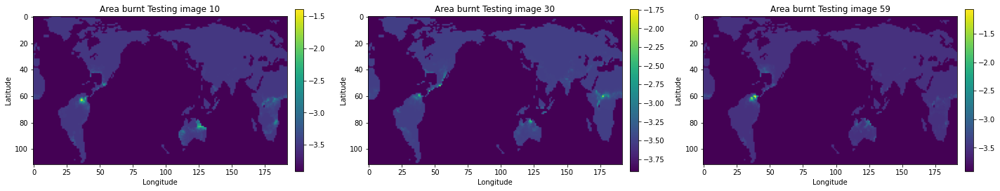

____________ Predictions multi CNN LSTM 12 to 12 _____________ 


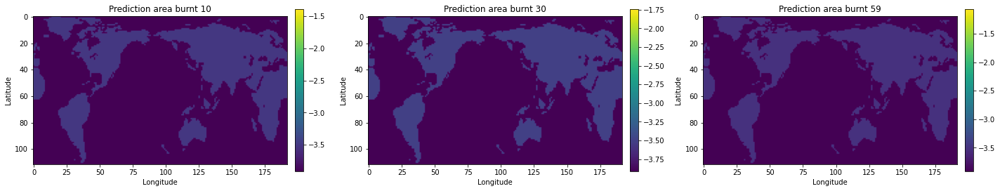

____________ Difference between both _____________ 


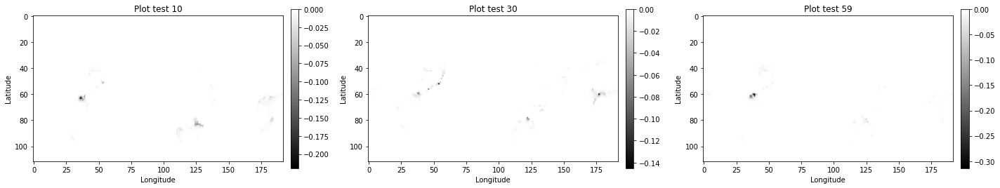

In [100]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[previous_month:], true_data=area_burnt_p4_m[previous_month:], ts=[10, 30, 59], title='Area burnt Testing image', threshold=0.03)

print("____________ Predictions multi CNN LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = area_burnt_pred_3to3_p4, true_data= area_burnt_p4_m[previous_month:], ts = [10, 30, 59], title='Prediction area burnt', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[previous_month:], data2 = area_burnt_pred_3to3_p4, ts = [10, 30, 59])

#### Plots

In [ ]:
#Moisture burnt 
print("____________ Real images of msoil moisture________________")
plot_data_img(1, 3, data = moist_testing_set_p1, true_data=moist_testing_set_p1, ts=[10, 30, 59], title='Moisture Testing image', threshold=0.1)

print("____________ Predictions mulit CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = moist_pred_p1, true_data=moist_testing_set_p1, ts = [10, 30, 59], title='Prediction of moisture', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = moist_pred_p1, data2 = moist_testing_set_p1, ts = [10, 30, 59])

In [ ]:
print("____________ Real images of vegetation________________")
plot_data_img(1, 3, data = veg_testing_set_p1, true_data=veg_testing_set_p1, ts=[10, 30, 59], title='VegetationTesting image', threshold=0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = veg_pred_p1, true_data=veg_testing_set_p1, ts = [10, 30, 59], title='Prediction of vegetation', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = veg_pred_p1, data2 = veg_testing_set_p1, ts = [10, 30, 59])

In [ ]:
#Temperature burnt 
print("____________ Real images of temperature________________")
plot_data_img(1, 3, data = temp_testing_set_p1, true_data=temp_testing_set_p1, ts=[10, 30, 59], title='Temperature Testing image', threshold=0.1)

print("____________ Predictions multi CAE LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = temp_pred_p1, true_data=temp_testing_set_p1, ts = [10, 30, 59], title='Prediction Temperature', threshold=0.1)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = temp_pred_p1, data2 = temp_testing_set_p1, ts = [10, 30, 59])

# Results

### Better to take multiple variables as inputs than just the area burnt

In [ ]:
pd.DataFrame([results_CAE_LSTM_M21, results_multi_CAE_LSTM_M21],
             index=['CAE LSTM - 12 to 1', 'multi CAE LSTM - 12 to 1',]
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi CAE LSTM - 12 to 1,31.418,0.000853,99.8950
CAE LSTM - 12 to 1,21.892,0.000874,99.8742


In [ ]:
pd.DataFrame([results_multi_CNN_LSTM_M21, results_CNN_LSTM_M21],
             index=['multi Conv LSTM - 12 to 1', 'Conv LSTM - 12 to 1']
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi Conv LSTM - 12 to 1,108.360,0.001428,99.6070
Conv LSTM - 12 to 1,21.892,0.002897,98.5131


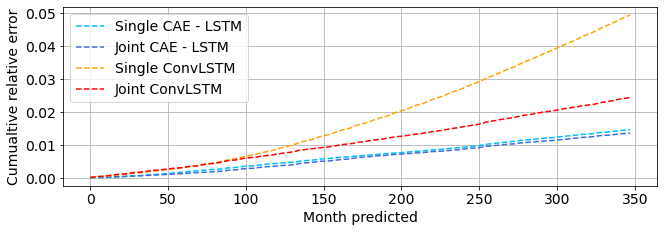

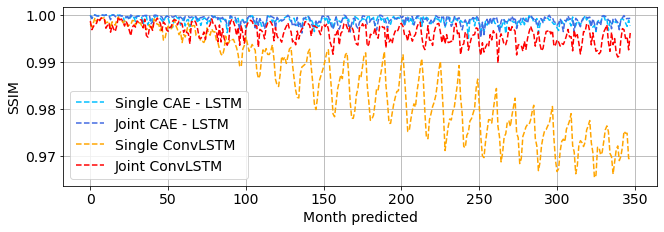

In [101]:
xlim=348
plt.rcParams.update({'font.size': 14})

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), sumRE_CAE_M21[:xlim], color='deepskyblue', linestyle='dashed', label='Single CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_M21[:xlim], color='royalblue', linestyle='dashed', label='Joint CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), sumRE_CNN_M21[:xlim], color='orange', linestyle='dashed', label='Single ConvLSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_M21[:xlim], color='red', linestyle='dashed', label='Joint ConvLSTM', linewidth=1.5)
# plt.ylim(0,ylim)
# plt.title('Cumulative sum of the relative error')
plt.xlabel('Month predicted')
plt.ylabel('Cumualtive relative error')
plt.grid(True)
plt.legend()
# fig.set_size_inches(15,2.5)
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/RE_cumsum1.png", dpi=300)
plt.show()

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), ssim_CAE_M21[:xlim], color='deepskyblue', linestyle='dashed', label='Single CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_M21[:xlim], color='royalblue', linestyle='dashed', label='Joint CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_CNN_M21[:xlim], color='orange', linestyle='dashed', label='Single ConvLSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_M21[:xlim], color='red', linestyle='dashed', label='Joint ConvLSTM', linewidth=1.5)
# plt.ylim(0,ylim)
# plt.title('Evolution predictions relative MSE')
plt.xlabel('Month predicted')
plt.ylabel('SSIM')
plt.grid(True)
plt.legend()
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/SSIM_1.png", dpi=300)
plt.show()

### Better to forecast multiple months than just one

In [ ]:
pd.DataFrame([results_multi_CAE_LSTM_M21, results_multi_CAE_LSTM_12to12],
             index=['multi CAE LSTM - 12 to 1', 'multi CAE LSTM - 12 to 12']
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi CAE LSTM - 12 to 1,31.418,0.000853,99.8950
multi CAE LSTM - 12 to 12,3.601,0.000797,99.9032


In [ ]:
pd.DataFrame([results_multi_CNN_LSTM_M21, results_multi_CNN_LSTM_M2M],
             index=['multi CNN LSTM - 12 to 1', 'multi CNN LSTM - 12 to 12']
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi CNN LSTM - 12 to 12,14.942,0.001368,99.6594
multi CNN LSTM - 12 to 1,108.360,0.001428,99.6070


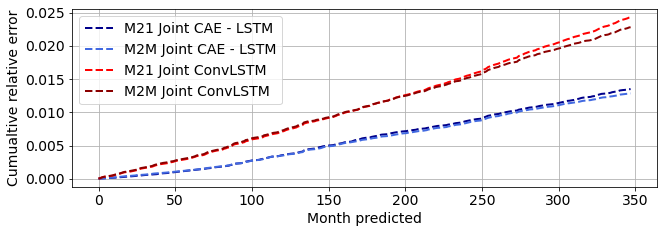

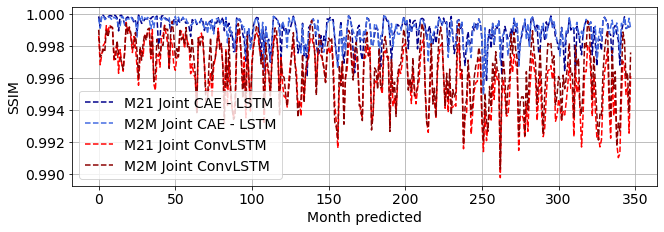

In [102]:
xlim=348

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_M21[:xlim], color='darkblue', linestyle='dashed', label='M21 Joint CAE - LSTM', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_M2M[:xlim], color='royalblue', linestyle='dashed', label='M2M Joint CAE - LSTM', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_M21[:xlim], color='red', linestyle='dashed', label='M21 Joint ConvLSTM', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_M2M[:xlim], color='darkred', linestyle='dashed', label='M2M Joint ConvLSTM', linewidth=2)
# plt.title('Cumulative sum of the relative error')
plt.xlabel('Month predicted')
plt.ylabel('Cumualtive relative error')
plt.grid(True)
plt.legend()
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/RE_cumsum2.png", dpi=300)
plt.show()

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_M21[:xlim], color='darkblue', linestyle='dashed', label='M21 Joint CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_M2M[:xlim], color='royalblue', linestyle='dashed', label='M2M Joint CAE - LSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_M21[:xlim], color='red', linestyle='dashed', label='M21 Joint ConvLSTM', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_M2M[:xlim], color='darkred', linestyle='dashed', label='M2M Joint ConvLSTM', linewidth=1.5)
# plt.title('Cumulative sum of the relative error')
plt.xlabel('Month predicted')
plt.ylabel('SSIM')
plt.grid(True)
plt.legend()
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/SSIM_2.png", dpi=300)
plt.show()

### Better to take as many previous months possible as inputs and forecast as many as possible

In [ ]:
pd.DataFrame([results_multi_CAE_LSTM_12to12, results_multi_CAE_LSTM_6to6, results_multi_CAE_LSTM_3to3],
             index=['multi CAE LSTM - 12 to 12', 'multi CAE LSTM - 6 to 6', 'multi CAE LSTM - 3 to 3']
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi CAE LSTM - 12 to 12,3.601,0.000797,99.9032
multi CAE LSTM - 3 to 3,11.040,0.001852,99.4461
multi CAE LSTM - 6 to 6,5.514,0.001822,99.4082


In [ ]:
pd.DataFrame([results_multi_CNN_LSTM_M2M, results_multi_CNN_LSTM_6to6, results_multi_CNN_LSTM_3to3],
             index=['multi CNN LSTM - 12 to 12', 'multi CNN LSTM - 6 to 6', 'multi CNN LSTM - 3 to 3']
             ).sort_values("mean SSIM", ascending=False)

,Time for predictions (s),relative error,mean SSIM
multi CNN LSTM - 12 to 12,14.942,0.001368,99.6594
multi CNN LSTM - 3 to 3,26.786,0.001461,99.6106
multi CNN LSTM - 6 to 6,23.095,0.001462,99.5778


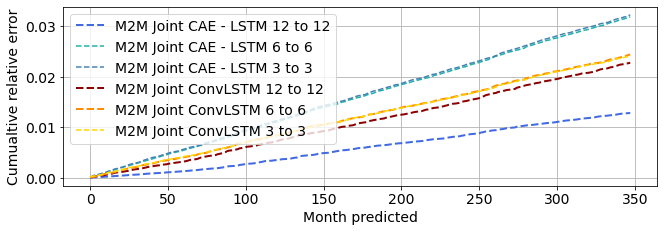

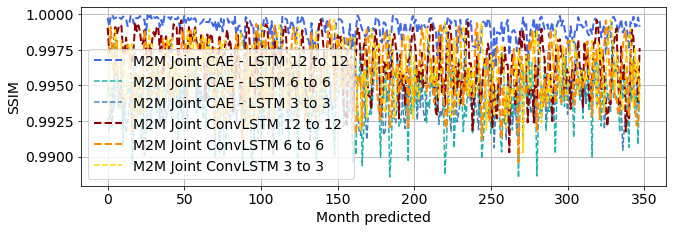

In [103]:
xlim=348
ylim= 0.001

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_M2M[:xlim], color='royalblue', linestyle='dashed', label='M2M Joint CAE - LSTM 12 to 12', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_6to6[:xlim], color='lightseagreen', linestyle='dashed', label='M2M Joint CAE - LSTM 6 to 6', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), sumRE_multiCAE_3to3[:xlim], color='steelblue', linestyle='dashed', label='M2M Joint CAE - LSTM 3 to 3', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_M2M[:xlim], color='darkred', linestyle='dashed', label='M2M Joint ConvLSTM 12 to 12', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_6to6[:xlim], color='darkorange', linestyle='dashed', label='M2M Joint ConvLSTM 6 to 6', linewidth=2)
plt.plot(np.arange(0,xlim,1), sumRE_multiCNN_3to3[:xlim], color='gold', linestyle='dashed', label='M2M Joint ConvLSTM 3 to 3', linewidth=1.5)
# plt.ylim(0,ylim)
# plt.title('Cumulative sum of the relative error')
plt.xlabel('Month predicted')
plt.ylabel('Cumualtive relative error')
plt.grid(True)
plt.legend()
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/RE_cumsum3.png", dpi=300)
plt.show()

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_M2M[:xlim], color='royalblue', linestyle='dashed', label='M2M Joint CAE - LSTM 12 to 12', linewidth=2)
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_6to6[:xlim], color='lightseagreen', linestyle='dashed', label='M2M Joint CAE - LSTM 6 to 6', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCAE_3to3[:xlim], color='steelblue', linestyle='dashed', label='M2M Joint CAE - LSTM 3 to 3', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_M2M[:xlim], color='darkred', linestyle='dashed', label='M2M Joint ConvLSTM 12 to 12', linewidth=2)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_6to6[:xlim], color='darkorange', linestyle='dashed', label='M2M Joint ConvLSTM 6 to 6', linewidth=2)
plt.plot(np.arange(0,xlim,1), ssim_multiCNN_3to3[:xlim], color='gold', linestyle='dashed', label='M2M Joint ConvLSTM 3 to 3', linewidth=1.5)
# plt.ylim(0,ylim)
# plt.title('Cumulative sum of the relative error')
plt.xlabel('Month predicted')
plt.ylabel('SSIM')
plt.grid(True)
plt.legend()
plt.tight_layout(pad=2.5)
plt.savefig("/content/drive/MyDrive/Wildfires_IRP/Figures/SSIM_3.png", dpi=300)
plt.show()

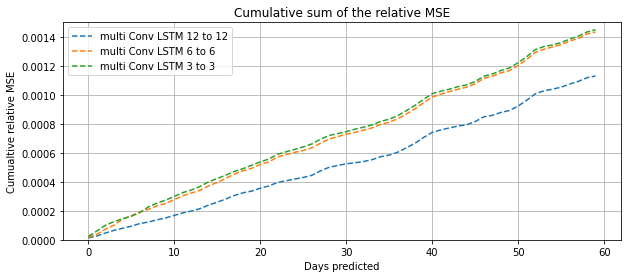

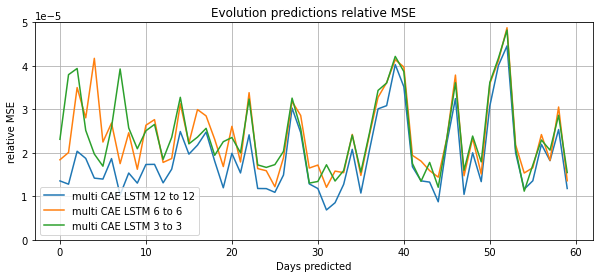

In [ ]:
xlim=60
ylim= 0.0015

plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), rmse_multi_cnn_M2M[:xlim], color='darkred', linestyle='dashed', label='joint ConvLSTM 12 to 12', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), rmse_multi_cnn_6to6[:xlim], '--', label='multi Conv LSTM 6 to 6', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), rmse_multi_cnn_3to3[:xlim], '--', label='multi Conv LSTM 3 to 3', linewidth=1.5)
plt.ylim(0,ylim)
plt.title('Cumulative sum of the relative MSE')
plt.xlabel('Days predicted')
plt.ylabel('Cumualtive relative MSE')
plt.grid(True)
plt.legend()
plt.show()

ylim = 0.00005
plt.figure(figsize=(10,4))
plt.plot(np.arange(0,xlim,1), relative_mse_multi_CNN_LSTM_M2M_nw[:xlim], '-', label='multi CAE LSTM 12 to 12', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), relative_mse_multi_CNN_LSTM_6to6_nw[:xlim], '-', label='multi CAE LSTM 6 to 6', linewidth=1.5)
plt.plot(np.arange(0,xlim,1), relative_mse_multi_CNN_LSTM_3to3_nw[:xlim], '-', label='multi CAE LSTM 3 to 3', linewidth=1.5)
plt.ylim(0,ylim)
plt.title('Evolution predictions relative MSE')
plt.xlabel('Days predicted')
plt.ylabel('relative MSE')
plt.grid(True)
plt.legend()
plt.show()

# Appendix - Display waht has been tried - Unstructured and uncommented

### MSE curves

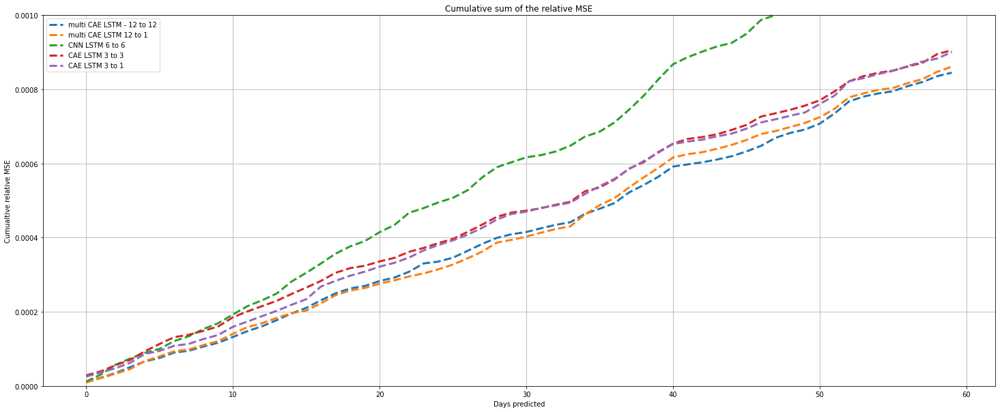

In [ ]:
xlim=60
ylim= 0.001

plt.figure(figsize=(25,10))
plt.plot(np.arange(0,xlim,1), rmseM2M_multicae_areagb[:xlim], '--', label='multi CAE LSTM - 12 to 12', linewidth=3)
plt.plot(np.arange(0,xlim,1), rmseM21_multicae_areagb[:xlim], '--', label='multi CAE LSTM 12 to 1', linewidth=3)
plt.plot(np.arange(0,xlim,1), rmseM2M_cnn[:xlim], '--', label='CNN LSTM 6 to 6', linewidth=3)
plt.plot(np.arange(0,xlim,1), rmseM2M[:xlim], '--', label='CAE LSTM 3 to 3', linewidth=3)
plt.plot(np.arange(0,xlim,1), rmseM21[:xlim], '--', label='CAE LSTM 3 to 1', linewidth=3)
plt.ylim(0,ylim)
plt.title('Cumulative sum of the relative MSE')
plt.xlabel('Days predicted')
plt.ylabel('Cumualtive relative MSE')
plt.grid(True)
plt.legend();

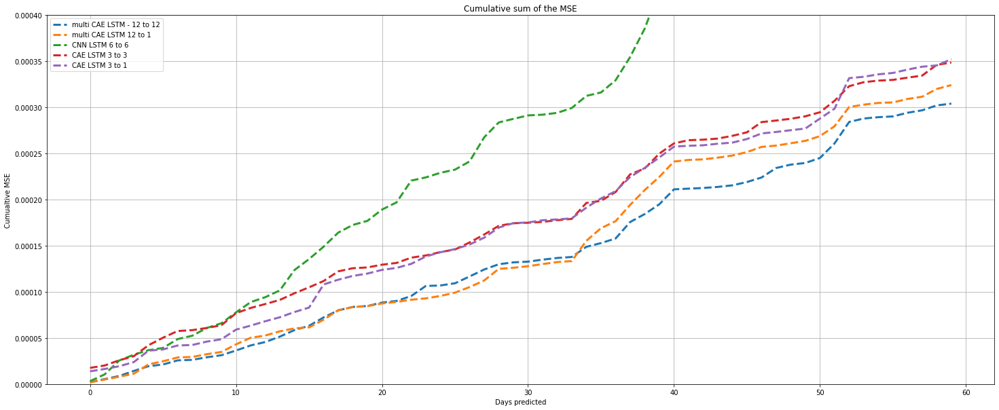

In [ ]:
xlim=60
ylim= 0.0004

plt.figure(figsize=(25,10))
plt.plot(np.arange(0,xlim,1), mseM2M_multicae_areagb[:xlim], '--', label='multi CAE LSTM - 12 to 12', linewidth=3)
plt.plot(np.arange(0,xlim,1), mseM21_multicae_areagb[:xlim], '--', label='multi CAE LSTM 12 to 1', linewidth=3)
plt.plot(np.arange(0,xlim,1), mseM2M_cnn[:xlim], '--', label='CNN LSTM 6 to 6', linewidth=3)
plt.plot(np.arange(0,xlim,1), mseM2M[:xlim], '--', label='CAE LSTM 3 to 3', linewidth=3)
plt.plot(np.arange(0,xlim,1), mseM21[:xlim], '--', label='CAE LSTM 3 to 1', linewidth=3)
plt.ylim(0,ylim)
plt.title('Cumulative sum of the MSE')
plt.xlabel('Days predicted')
plt.ylabel('Cumualtive MSE')
plt.grid(True)
plt.legend();

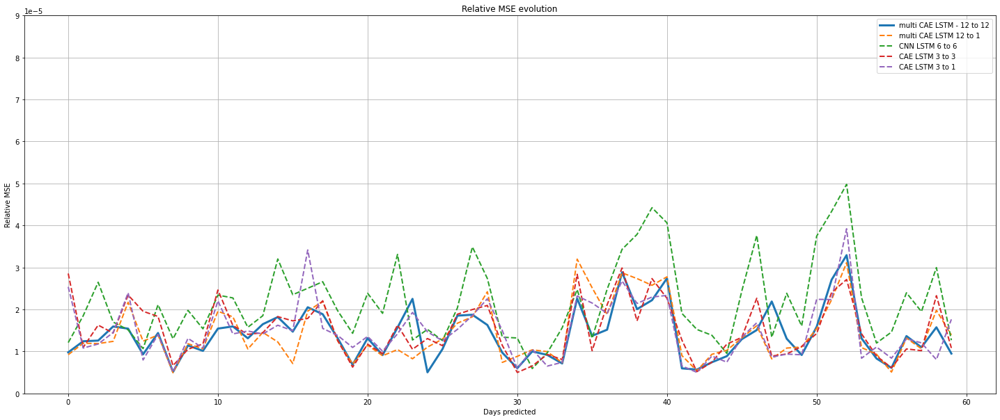

In [ ]:
xlim=60
ylim = 0.00009

plt.figure(figsize=(25,10))
plt.plot(np.arange(0,xlim,1), relative_mse_multi_CAE_LSTM_M2M_nw[:xlim], '-', label='multi CAE LSTM - 12 to 12', linewidth=3)
plt.plot(np.arange(0,xlim,1), relative_mse_multi_CAE_LSTM_M21_nw[:xlim], '--', label='multi CAE LSTM 12 to 1', linewidth=2)
plt.plot(np.arange(0,xlim,1), relative_mse_CNN_LSTM_M2M_nw[:xlim], '--', label='CNN LSTM 6 to 6', linewidth=2)
plt.plot(np.arange(0,xlim,1), relative_mse_CAE_LSTM_M2M_nw[:xlim], '--', label='CAE LSTM 3 to 3', linewidth=2)
plt.plot(np.arange(0,xlim,1), relative_mse_CAE_LSTM_M21_nw[:xlim], '--', label='CAE LSTM 3 to 1', linewidth=2)
plt.ylim(0,ylim)
plt.title('Relative MSE evolution')
plt.xlabel('Days predicted')
plt.ylabel('Relative MSE')
plt.grid(True)
plt.legend();

In [ ]:
np.where(np.array(relative_mse_multi_CAE_LSTM_M2M_nw) >2.8e-5)

(array([37, 52]),)

In [ ]:
np.where(np.array(relative_mse_multi_CAE_LSTM_M2M_nw) < 5.5e-6)

(array([ 7, 24]),)

____________ Real images of area burnt________________


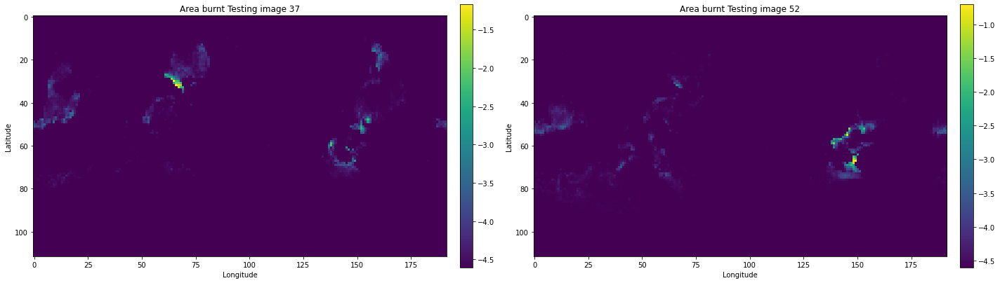

____________ Predictions multi CAE LSTM 6 to 1 _____________ 


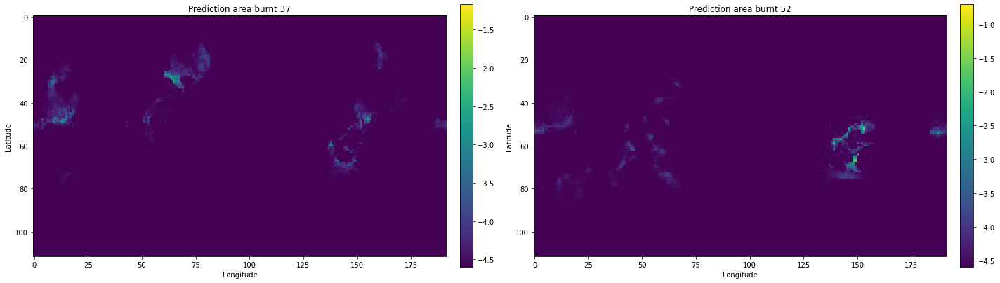

____________ Difference between both _____________ 


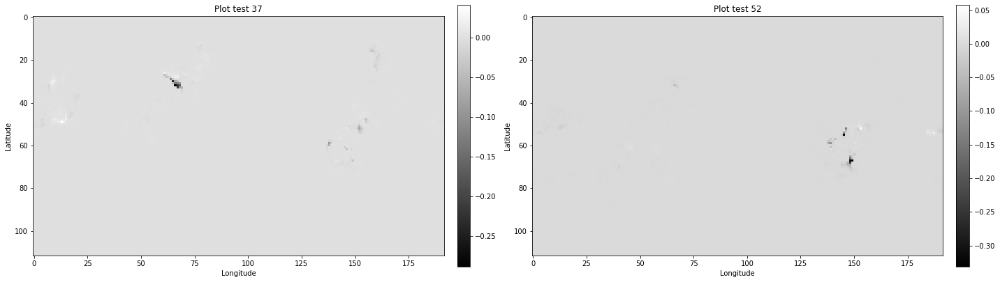

In [ ]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 2, data = area_testing_set_p1, true_data=area_testing_set_p1, ts=[37, 52], title='Area burnt Testing image')

print("____________ Predictions multi CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 2, data = area_burnt_pred_p1, true_data= area_testing_set_p1, ts = [37, 52], title='Prediction area burnt')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 2, data1 = area_testing_set_p1, data2 = area_burnt_pred_p1, ts = [37, 52])

____________ Real images of area burnt________________


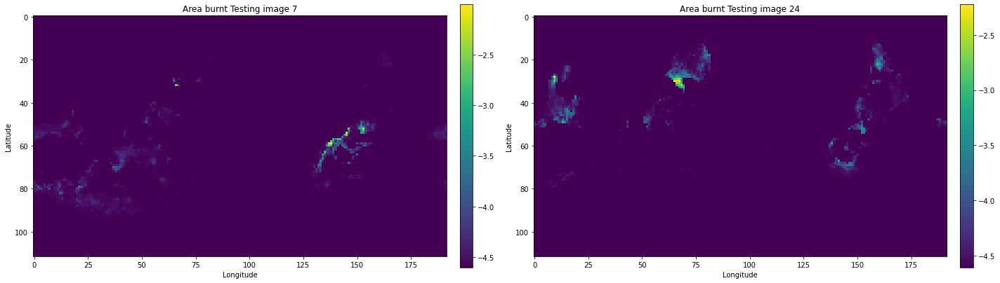

____________ Predictions multi CAE LSTM 6 to 1 _____________ 


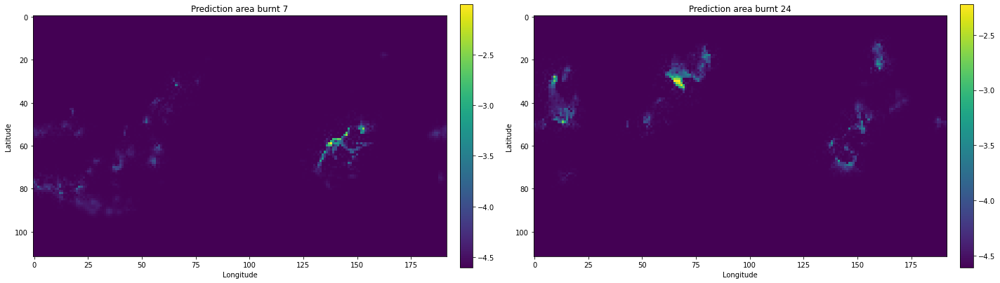

____________ Difference between both _____________ 


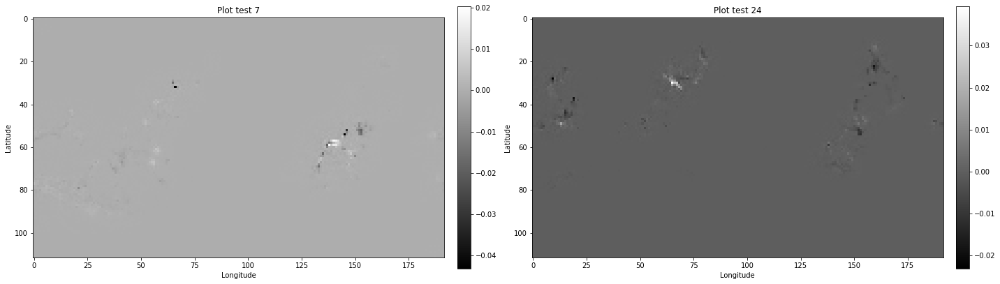

In [ ]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 2, data = area_testing_set_p1, true_data=area_testing_set_p1, ts=[7, 24], title='Area burnt Testing image')

print("____________ Predictions multi CAE LSTM 6 to 1 _____________ ")
plot_data_img(1, 2, data = area_burnt_pred_p1, true_data= area_testing_set_p1, ts = [7, 24], title='Prediction area burnt')

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 2, data1 = area_testing_set_p1, data2 = area_burnt_pred_p1, ts = [7, 24])

### Predictions CNN lSTM 12 to 12

In [ ]:
start = time.time()

previous_month = 12

pred_CNN_M2M_p4 = list(area_burnt_p4[-previous_month:])

while len(pred_CNN_M2M_p4) < 348 + previous_month :
  prediction = np.squeeze(CNN_LSTM_12to12.predict(np.reshape(pred_CNN_M2M_p4[-previous_month:], newshape=(1, previous_month, 112, 192, 1))))
  for i in range(previous_month):
    pred_CNN_M2M_p4.append(prediction[i])

fpred_cnn_M2M_p4 = np.squeeze(pred_CNN_M2M_p4)[previous_month:348+previous_month]
end = time.time()

In [ ]:
for i in range(348) :
  fpred_cnn_M2M_p4[i][land_mask==-1] = -0.01

In [ ]:
relative_mse_CNN_LSTM_M2M_nw = [np.linalg.norm(elem2 - elem) / 6468 for elem, elem2 in zip(fpred_cnn_M2M_p4, area_burnt_p4_m[12:])]
mse_CNN_LSTM_M2M = mean_squared_error(fpred_cnn_M2M_p4.ravel(), area_burnt_p4_m[12:].ravel())
relative_mse_CNN_LSTM_M2M_ow = np.linalg.norm(area_burnt_p4_m[12:] - fpred_cnn_M2M_p4) / 6468

rmse_cnn_M2M = np.cumsum(relative_mse_CNN_LSTM_M2M_nw)
mse_cnn_M2M = np.cumsum([mean_squared_error(elem, elem2) for elem, elem2 in zip(fpred_cnn_M2M_p4, area_burnt_p4_m[12:])])

In [ ]:
results_CNN_LSTM_M2M = {'Time for predictions (s)': round(end - start, 3), 
          #  'relative mse new way':  np.mean(relative_mse_CAE_LSTM_M21_nw),
           'relative error':  relative_mse_CNN_LSTM_M2M_ow,
           'mse_test' : mse_CNN_LSTM_M2M
          }

In [ ]:
results_CNN_LSTM_M2M

{'Time for predictions (s)': 3.171,
 'mse_test': 1.3474790958012315e-05,
 'relative error': 0.0015525309070173183}

#### Plots

____________ Real images of area burnt________________


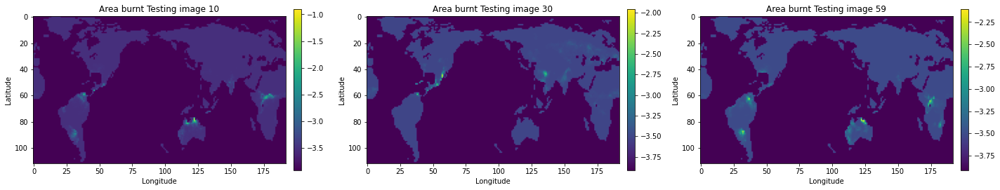

____________ Predictions multi CNN LSTM 12 to 12 _____________ 


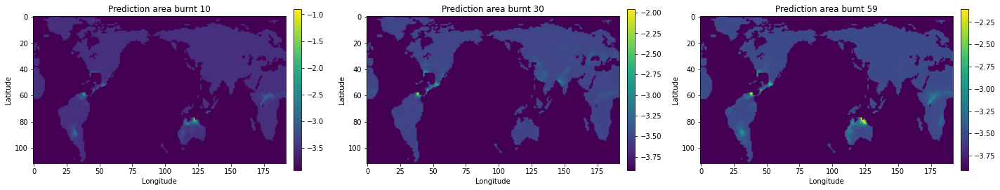

____________ Difference between both _____________ 


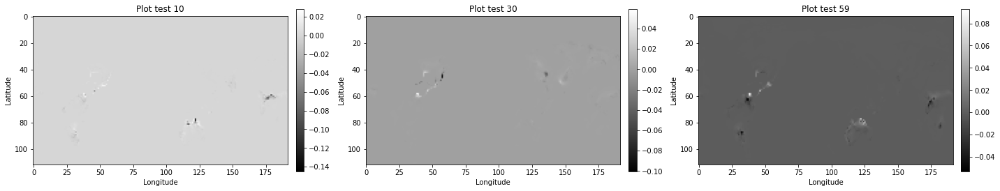

In [ ]:
#Area burnt 
print("____________ Real images of area burnt________________")
plot_data_img(1, 3, data = area_burnt_p4_m[12:], true_data=area_burnt_p4_m[12:], ts=[10, 30, 59], title='Area burnt Testing image', threshold=0.03)

print("____________ Predictions multi CNN LSTM 12 to 12 _____________ ")
plot_data_img(1, 3, data = fpred_cnn_M2M_p4, true_data= area_burnt_p4_m[12:], ts = [10, 30, 59], title='Prediction area burnt', threshold=0.03)

print("____________ Difference between both _____________ ")
plot_data_img_diff(1, 3, data1 = area_burnt_p4_m[12:], data2 = fpred_cnn_M2M_p4, ts = [10, 30, 59])